#Суть проекта. Описание данных. Этапы работы

***Анализ поведения пользователей-участников благотворительного фонда "АиФ Доброе сердце"***

Для исследования были представлены данные о пользователях, в том числе их гендере, регионе проживания, дате регистрации, подписке. Так же имеющиеся данные содержат информацию об их пожертвованиях фонду, дате, стоимости и названии продукта. Помимо этого получена информация о пользователях, сотрудничающих с фондом уже длительное время, а так же данные о каналах привлечения пользователей.

**Цель исследования:**

Определить портрет пользователя в целом. Выявить особенности поведения исторических пользователей и новых отдельно. Рассчитать пользовательские, маркетинговые и коммерческие метрики. Провести RFM-анализ и описать полученные сегменты. Определить эффективность каналов привлечения пользователей. Дать общие выводы и практические рекомендации опираясь на результаты анализа.

**Описание данных:**

Файл *donor_id.csv* (информация о донорах):

* CustomerCustomFieldsRecurrent	- рекуррент да / нет
* CustomerCustomFieldsVolunteer	- волонтер да / нет
* CustomerSex	- пол пользователя
* CustomerAreaIdsExternalId -	идентификатор региона пользователя
* CustomerAreaName -	название региона пользователя
* CustomerIanaTimeZone -	часовой пояс пользователя
* CustomerTimeZoneSource -	источник данных о часовом поясе
* CustomerIdsMindboxId -	идентификатор пользователя
* CustomerIsEmailInvalid - почта невалидна да / нет
* CustomerChangeDateTimeUtc -	дата регистрации / редактирования
* CustomerCustomerSubscriptions DobroaifIsSubscribed -	подписка
* CustomerCustomerSubscriptions DobroaifSmsIsSubscribed -	подписка в точке контакта SMS
* CustomerCustomerSubscriptions DobroaifEmailIsSubscribed -	подписка в точке контакта email
* CustomerCustomerSubscriptions DobroaifViberIsSubscribed	- подписка в точке контакта Viber
* CustomerCustomerSubscriptions
DobroaifMobilePushIsSubscribed - подписка в точке контакта Mobile Push
* CustomerCustomerSubscriptions
DobroaifWebPushIsSubscribed -	подписка в точке контакта Web Push

Файл *order.csv* (информация о пожертвованиях):

* OrderIdsMindboxId - идентификатор платежа
* OrderFirstActionIdsMindboxId - идентификатор действия
* OrderFirstActionDateTimeUtc -	дата и время оформления заказа
* OrderFirstActionChannelIdsMindboxId -	идентификатор точки контакта
* OrderFirstActionChannelIdsExternalId - внешний идентификатор точки контакта
* OrderFirstActionChannelName -	наименование точки контакта
* OrderAreaIdsExternalId - идентификатор региона пользователя
* OrderTransactionIdsExternalId - внешний идентификатор транзакции
* OrderTotalPrice -	стоимость заказа
* OrderIdsWebsiteID - идентификатор заказа на сайте
* OrderCustomFieldsNewyear - наличие поля с новым годом
* OrderCustomFieldsNextPayDate - дата следующего списания денег
* OrderCustomFieldsRecurrent - рекурент да / нет
* OrderCustomFieldsRepayment - повторный платеж
* OrderLineProductIdsWebsite - идентификатор продукта на сайте
* OrderLineProductName - название продукта
* OrderLineQuantity -	количество единиц продукта
* OrderLineBasePricePerItem -	базовая цена за единицу продукта
* OrderLinePriceOfLine - итоговая цена
* OrderLineStatusIdsExternalId - идентификатор статуса позиции заказа
* OrderCustomerIdsMindboxId -	идентификатор пользователя

Файл *import.csv* (информация об историческом импорте):

* CustomerActionCustomerIdsMindboxId - идентификатор пользователя

Файл *channels.pkl* (информация о каналах привлечения):

* User_action	- название действия пользователя
* Action_date	- дата действия пользователя
* Channel_id	- идентификатор канала (описание в текстовом файле)
* Utm_campaign	- кампания
* Utm_source	- ресурс
* Utm_medium	- что-то дублирующееся
* User_id	- идентификатор пользователя
* Action_time	- час действия пользователя

**Этапы анализа:**

* Загрузка данных
* Предобработка данных. Подготовка к анализу
* Исследовательский анализ
* Аналитический блок
* Основные выводы

#Загрузка данных. Выводы по качеству данных

##Загрузка данных в датасеты

In [ ]:
# инсталляция библиотеки яндекс диска
!pip -q install yadisk

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.4/91.4 kB 1.5 MB/s eta 0:00:00


In [ ]:
# инсталляция библиотеки profiling
!pip -q install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 8.7 MB/s eta 0:00:00


In [ ]:
# импорт необходимых для работы библиотек
import yadisk
import os
import sys
from tqdm import tqdm
import pandas as pd
import scipy.stats as stats
import numpy as np
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from wordcloud import WordCloud
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# загрузка переменных среды для яндекс диск
app_id = '3a7bf81215c04f85842decdd113ec817'
secret_id = 'fa580b0d887c4065b2879d0074362da9'
ya_token = 'y0_AgAAAABo3h-bAAvILgAAAAEE0pVkAACJdaxsZnBEs5IOgruh5LopLffobQ'

In [ ]:
# подключение к яндекс диску
y = yadisk.YaDisk(app_id, secret_id, ya_token)

In [ ]:
# проверка подключения через валидность токена
if y.check_token():
    print('Token correct')

Token correct


In [ ]:
# создание списка файлов для загрузки
list_of_files = []
for el in tqdm(list(y.listdir('aif'))):
    if el['path'].endswith('.csv') or el['path'].endswith('.pkl'):
        list_of_files.append(el['path'])
list_of_files

100%|██████████| 4/4 [00:00<00:00, 36314.32it/s]


['disk:/aif/channels.pkl',
 'disk:/aif/id_donor.csv',
 'disk:/aif/import.csv',
 'disk:/aif/order.csv']

In [ ]:
# создание папки для загрузки файлов из яндекс диска
load_path = '/content/ya/'
if not os.path.exists(load_path):
    os.mkdir(load_path)
os.chdir(load_path)

In [ ]:
# скачивание файлов из яндекс диска в коллаб
for file in tqdm(list_of_files):
    y.download(file.split(':')[1], file.split('/')[-1])

100%|██████████| 4/4 [00:20<00:00,  5.04s/it]


In [ ]:
# загрузка скаченных файлов в соответствующие датасеты
donors = pd.read_csv('id_donor.csv', encoding='cp1251', sep=';')
orders = pd.read_csv('order.csv', encoding='cp1251', sep=';')
imports = pd.read_csv('import.csv', encoding='cp1251', sep=';')
channels = pd.read_pickle('channels.pkl')

In [ ]:
# создание функции для поверхностной оценки данных
def allview(df):
    display(df.head(2))
    print(' ')
    print(df.info())
    print('Исходное состояние DataFrame', df.shape)
    print(' ')
    print(df.isna().sum())
    print(' ')
    print('Количество явных дубликатов', df.duplicated().sum())

In [ ]:
# оценка данных датасета donors
allview(donors)

,CustomerCustomFieldsRecurrent = Рекуррент,CustomerCustomFieldsVolunteer = Волонтер да/нет,CustomerSex = Пол,CustomerAreaIdsExternalId = Идентификатор географической зоны клиента,CustomerAreaName = Название географической зоны клиента,CustomerIanaTimeZone = Часовой пояс,CustomerTimeZoneSource = Источник информации о часовом поясе,CustomerIdsMindboxId = Идентификатор Mindbox,CustomerIsEmailInvalid = Адрес электронной почты невалиден,CustomerChangeDateTimeUtc = Дата регистрации/редактирования в формате yyyy-MM-dd HH:mm:ss.fff,CustomerCustomerSubscriptionsDobroaifIsSubscribed = Подписка,CustomerCustomerSubscriptionsDobroaifSmsIsSubscribed = Подписка в точке контакта SMS,CustomerCustomerSubscriptionsDobroaifEmailIsSubscribed = Подписка в точке контакта Email,CustomerCustomerSubscriptionsDobroaifViberIsSubscribed = Подписка в точке контакта Viber,CustomerCustomerSubscriptionsDobroaifMobilePushIsSubscribed = Подписка в точке контакта MobilePush,CustomerCustomerSubscriptionsDobroaifWebPushIsSubscribed = Подписка в точке контакта WebPush
0,NaN,NaN,female,75,Ульяновская область,Europe/Samara,Определили в трекере,2734,False,21.05.2023 13:19,NaN,NaN,True,NaN,NaN,NaN
1,False,NaN,female,63,Санкт-Петербург и ЛО,Europe/Moscow,Определили в трекере,2847,False,24.12.2023 5:41,NaN,NaN,True,NaN,NaN,NaN


 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23820 entries, 0 to 23819
Data columns (total 16 columns):
 #   Column                                                                                              Non-Null Count  Dtype 
---  ------                                                                                              --------------  ----- 
 0   CustomerCustomFieldsRecurrent = Рекуррент                                                           5923 non-null   object
 1   CustomerCustomFieldsVolunteer =  Волонтер да/нет                                                    6 non-null      object
 2   CustomerSex = Пол                                                                                   18715 non-null  object
 3   CustomerAreaIdsExternalId = Идентификатор географической зоны клиента                               5044 non-null   object
 4   CustomerAreaName = Название географической зоны клиента                                             5044 non-null   

In [ ]:
# оценка данных датасета orders
allview(orders)

,OrderIdsMindboxId = Идентификатор Mindbox,OrderFirstActionIdsMindboxId = Идентификатор Mindbox,OrderFirstActionDateTimeUtc = Дата и время оформления заказа по UTC,OrderFirstActionChannelIdsMindboxId = Идентификатор Mindbox,OrderFirstActionChannelIdsExternalId = Внешний идентификатор точки контакта,OrderFirstActionChannelName = Имя точки контакта,OrderAreaIdsExternalId = Идентификатор географической зоны клиента,OrderTransactionIdsExternalId = Идентификатор транзакции,OrderTotalPrice = Стоимость заказа,OrderIdsWebsiteID = Идентификатор заказа на сайте,...,OrderCustomFieldsNextPayDate = Дата след. Списания,OrderCustomFieldsRecurrent = Регулярный да/нет,OrderCustomFieldsRepayment = Повторный рекуррент,OrderLineProductIdsWebsite = Id продукта в Сайт,OrderLineProductName = Техническое название продукта,OrderLineQuantity = Количество единиц продукта,OrderLineBasePricePerItem = Базовая цена продукта за единицу продукта,OrderLinePriceOfLine = Конечная цена,OrderLineStatusIdsExternalId = Идентификатор статуса позиции заказа,OrderCustomerIdsMindboxId = Идентификатор Mindbox
0,14588,57400,27.01.2022 0:00,1,Administrator,Административный сайт Mindbox,NaN,NaN,500,1002892689,...,NaN,NaN,NaN,9847,Пожертвование Благотворительный фонд «АиФ. Доб...,1,NaN,500,Paid,6959
1,14756,57577,29.01.2022 0:00,1,Administrator,Административный сайт Mindbox,NaN,NaN,200,1004662779,...,NaN,NaN,NaN,9847,Пожертвование Благотворительный фонд «АиФ. Доб...,1,NaN,200,Paid,7103


 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73763 entries, 0 to 73762
Data columns (total 21 columns):
 #   Column                                                                       Non-Null Count  Dtype  
---  ------                                                                       --------------  -----  
 0   OrderIdsMindboxId = Идентификатор Mindbox                                    73763 non-null  int64  
 1   OrderFirstActionIdsMindboxId = Идентификатор Mindbox                         73763 non-null  int64  
 2   OrderFirstActionDateTimeUtc = Дата и время оформления заказа по UTC          73763 non-null  object 
 3   OrderFirstActionChannelIdsMindboxId = Идентификатор Mindbox                  73763 non-null  int64  
 4   OrderFirstActionChannelIdsExternalId = Внешний идентификатор точки контакта  73763 non-null  object 
 5   OrderFirstActionChannelName = Имя точки контакта                             73763 non-null  object 
 6   OrderAreaIdsExternalId = Идентификат

*Проверим поле OrderCustomFieldsNewyear = newyear на уникальные значения*



In [ ]:
# дополнительно проверим данный столбец
orders['OrderCustomFieldsNewyear = newyear'].unique()

array([nan, True], dtype=object)

In [ ]:
# оценка данных датасета imports
allview(imports)

,CustomerActionIdsMindboxId,CustomerActionActionTemplateIdsSystemName,CustomerActionActionTemplateName,CustomerActionDateTimeUtc,CustomerActionCreationDateTimeUtc,CustomerActionBrandIdsSystemName,CustomerActionChannelIdsMindboxId,CustomerActionChannelName,CustomerActionChannelIdsExternalId,CustomerActionChannelIdsSystemName,CustomerActionChannelUtmCampaign,CustomerActionChannelUtmSource,CustomerActionChannelUtmMedium,CustomerActionChannelUtmContent,CustomerActionChannelUtmTerm,CustomerActionCustomerIdsBackendID,CustomerActionCustomerIdsWebsiteID,CustomerActionCustomerIdsMindboxId
0,2734,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:30,19.03.2022 21:30,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2734
1,2847,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:31,19.03.2022 21:31,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2847


 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7651 entries, 0 to 7650
Data columns (total 18 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   CustomerActionIdsMindboxId                 7651 non-null   int64  
 1   CustomerActionActionTemplateIdsSystemName  7651 non-null   object 
 2   CustomerActionActionTemplateName           7651 non-null   object 
 3   CustomerActionDateTimeUtc                  7651 non-null   object 
 4   CustomerActionCreationDateTimeUtc          7651 non-null   object 
 5   CustomerActionBrandIdsSystemName           7651 non-null   object 
 6   CustomerActionChannelIdsMindboxId          7651 non-null   int64  
 7   CustomerActionChannelName                  7651 non-null   object 
 8   CustomerActionChannelIdsExternalId         7651 non-null   object 
 9   CustomerActionChannelIdsSystemName         7651 non-null   object 
 10  CustomerActionChannelU

In [ ]:
# оценка данных датасета channels
allview(channels)

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time
0,Копия Фандрайзинговая. Максим Широкин,2022-12-20,3,NaN,NaN,NaN,2734,7
1,Копия Фандрайзинговая. Максим Широкин Не доста...,2022-12-20,3,NaN,NaN,NaN,2734,7


 
<class 'pandas.core.frame.DataFrame'>
Index: 2864953 entries, 0 to 873421
Data columns (total 8 columns):
 #   Column        Dtype 
---  ------        ----- 
 0   user_action   object
 1   action_date   object
 2   channel_id    int64 
 3   utm_campaign  object
 4   utm_source    object
 5   utm_medium    object
 6   user_id       int64 
 7   action_time   int32 
dtypes: int32(1), int64(2), object(5)
memory usage: 185.8+ MB
None
Исходное состояние DataFrame (2864953, 8)
 
user_action           0
action_date           0
channel_id            0
utm_campaign    2815634
utm_source      2815634
utm_medium      2815634
user_id               0
action_time           0
dtype: int64
 
Количество явных дубликатов 224952


##Выводы

* в датасете *donors*, типы данных практически во всех полях соответствуют оптимальным, за исключением поля "CustomerChangeDateTimeUtc", где указаны дата и время регистрации пользователя (фактически тип данных *object*, *datetime* будет более предпочтителен). Так же актуальным будет замена названий столбцов на более компактные и в "змеином" регистре. По причине отсутствия необходимости применения столбцов "CustomerAreaIdsExternalId " (идентификатор географической зоны) и "CustomerTimeZoneSource" (источник информации о часовом поясе) в дальнейшем анализе их можно удалить. Пропущенные значения обнаружены в огромном количестве во всех полях, за исключением столбца с id пользователя "CustomerIdsMindboxId" и вышеупомянутого поля с датой регистрации пользователя "CustomerChangeDateTimeUtc". Пропуски решено оставить без изменений. Наличие явных дубликатов в датасете не установлено
* датасет *orders*. Типы данных практически во всех полях соответствуют оптимальным, в поле "OrderFirstActionDateTimeUtc", где указана дата оформления заказа аналогично для удобства следует заменить на тип *datetime*. Для удобства актуальным будет замена названий столбцов на более компактные и в "змеином" регистре. По причине полного отсутствия данных, поля "OrderAreaIdsExternalId" (идентификатор географической зоны), "OrderTransactionIdsExternalId" (идентификатор транзакции), "OrderCustomFieldsNextPayDate" (дата следующего списания) для удобства можно удалить. Пропущенные значения помимо вышеупомянутых столбцов в большом количестве были обнаружены в "OrderCustomFieldsNewyear" (наличие поля с новым годом), "OrderCustomFieldsRecurrent" (рекуррент ли пользователь), "OrderCustomFieldsRepayment" (повторный рекуррент), "OrderLineBasePricePerItem" (базовая цена продукта за единицу продукта). Кроме поля "OrderCustomFieldsNewyear", где указано наличие акции "Новый год", пропуски решено оставить без изменений. В поле "OrderCustomFieldsNewyear" пропуски в количестве 71882 решено заполнить значением False, так как судя по уникальным значениям в данном столбце значение False вовсе отсутствует. Следовательно можно предположить, что по технической причине именно в случае необходимости внесения в данные значения False сформировались пропуски. Наличие явных дубликатов в датасете не установлено
* датасет *imports*. В рамках настоящего анализа в данном датасете нам интересны только идентификаторы исторических пользователей, поле "CustomerActionIdsMindboxId" (название поля для удобства можно заменить на более компактное и в "змеином" регистре). Тип данных, отсутствие пропусков и дубликатов указывают на ненадобность предобработки.
* датасет *channels*. Практически во всех столбцах типы данных оптимальны, за исключением "action_date", где тип данных следует заменить с *object* на *datetime*. В столбцах "utm_campaign", "utm_source" и "utm_medium", содержащих информацию о кампании, ресурсе и "чем-то дублирующем" данные практически отсутствуют (содержат в основном пропуски). Обнаружены явные дубликаты в количестве 224952, что стоставляет около 8% от общего объема данных. Ввиду небольшого количества, явные дубликаты решено удалить
* наличие огромного количества пропусков во всех датасетах можно объяснить техническим сбоем при сборе или хранении информации
* так же, согласно ТЗ, столбцы с датой того или иного события в имеющихся датасетах отображают время в UTC, соответственно переведем его в московское, прибавив 3 часа

#Предобработка данных

##Замена типов данных. Переименование полей. Удаление не нужных полей

*Обработка датасета donors*

In [ ]:
# удаление не актуальных столбцов
donors = donors.drop(['CustomerAreaIdsExternalId = Идентификатор географической зоны клиента',
                      'CustomerTimeZoneSource = Источник информации о часовом поясе'], axis=1)

In [ ]:
# переименование полей в датасете для последующего удобства
donors.columns = ['recurrent', 'volunteer', 'sex', 'area_name', 'time_zone', 'donor_id', 'email_invalid', 'reg_change_date',
                  'subscriptions', 'sub_sms', 'sub_email', 'sub_viber', 'sub_mobile_push', 'sub_web_push']

In [ ]:
# проверка результата произведенных преобразований
donors.columns

Index(['recurrent', 'volunteer', 'sex', 'area_name', 'time_zone', 'donor_id',
       'email_invalid', 'reg_change_date', 'subscriptions', 'sub_sms',
       'sub_email', 'sub_viber', 'sub_mobile_push', 'sub_web_push'],
      dtype='object')

In [ ]:
# замена типа данных в поле 'reg_change_date'
donors['reg_change_date'] = pd.to_datetime(donors['reg_change_date'])
donors['reg_change_date'] = donors['reg_change_date'] + dt.timedelta(hours=3) #преобразование времени по UTC в московское
donors.dtypes #проверка результата

recurrent                  object
volunteer                  object
sex                        object
area_name                  object
time_zone                  object
donor_id                    int64
email_invalid              object
reg_change_date    datetime64[ns]
subscriptions              object
sub_sms                    object
sub_email                  object
sub_viber                  object
sub_mobile_push            object
sub_web_push               object
dtype: object

In [ ]:
# создание дополнительного поля, где указан только день регистрации/редактирования
donors['reg_change_date_day'] = donors['reg_change_date'].dt.date
donors['reg_change_date_day'] = pd.to_datetime(donors['reg_change_date_day'])

In [ ]:
#оценка подготовленного датасета
donors.head()

,recurrent,volunteer,sex,area_name,time_zone,donor_id,email_invalid,reg_change_date,subscriptions,sub_sms,sub_email,sub_viber,sub_mobile_push,sub_web_push,reg_change_date_day
0,NaN,NaN,female,Ульяновская область,Europe/Samara,2734,False,2023-05-21 16:19:00,NaN,NaN,True,NaN,NaN,NaN,2023-05-21
1,False,NaN,female,Санкт-Петербург и ЛО,Europe/Moscow,2847,False,2023-12-24 08:41:00,NaN,NaN,True,NaN,NaN,NaN,2023-12-24
2,NaN,NaN,female,Москва и МО,Europe/Moscow,2861,False,2023-03-10 11:16:00,NaN,True,True,NaN,NaN,NaN,2023-03-10
3,NaN,NaN,female,Ростовская область,Europe/Moscow,3361,True,2022-12-20 12:36:00,NaN,NaN,False,NaN,NaN,NaN,2022-12-20
4,False,NaN,male,Москва и МО,Europe/Moscow,4982,False,2023-12-18 22:43:00,NaN,NaN,True,NaN,NaN,NaN,2023-12-18


*Обработка датасета orders*

In [ ]:
# удаление не актуальных столбцов
orders = orders.drop(['OrderAreaIdsExternalId = Идентификатор географической зоны клиента',
                      'OrderTransactionIdsExternalId = Идентификатор транзакции',
                      'OrderCustomFieldsNextPayDate = Дата след. Списания'], axis=1)

In [ ]:
# переименование полей датасета для удобства
orders.columns = ['order_id', 'action_id', 'order_date', 'channel_id', 'outer_channel_id', 'channel_name', 'order_price',
                  'order_web_id', 'order_ny', 'recurrent', 'repayment', 'product_web_id', 'product_name', 'order_quantity',
                  'base_product_price', 'order_price_line', 'order_status_id', 'customer_id']

In [ ]:
# проверка результата преобразований
orders.columns

Index(['order_id', 'action_id', 'order_date', 'channel_id', 'outer_channel_id',
       'channel_name', 'order_price', 'order_web_id', 'order_ny', 'recurrent',
       'repayment', 'product_web_id', 'product_name', 'order_quantity',
       'base_product_price', 'order_price_line', 'order_status_id',
       'customer_id'],
      dtype='object')

In [ ]:
# замена типа данных в поле 'order_date', 'channel_id'
orders['order_date'] = pd.to_datetime(orders['order_date'])
orders.dtypes #проверка результата

order_id                       int64
action_id                      int64
order_date            datetime64[ns]
channel_id                     int64
outer_channel_id              object
channel_name                  object
order_price                    int64
order_web_id                  object
order_ny                      object
recurrent                     object
repayment                     object
product_web_id                object
product_name                  object
order_quantity                 int64
base_product_price           float64
order_price_line               int64
order_status_id               object
customer_id                    int64
dtype: object

In [ ]:
# заполнение пропусков в поле order_ny
orders['order_ny'] = orders['order_ny'].fillna(False)
orders['order_ny'].unique() #и проверка результата заполнения пропусков

array([False,  True])

In [ ]:
# оценка подготовленного датасета
orders.head()

,order_id,action_id,order_date,channel_id,outer_channel_id,channel_name,order_price,order_web_id,order_ny,recurrent,repayment,product_web_id,product_name,order_quantity,base_product_price,order_price_line,order_status_id,customer_id
0,14588,57400,2022-01-27,1,Administrator,Административный сайт Mindbox,500,1002892689,False,NaN,NaN,9847,Пожертвование Благотворительный фонд «АиФ. Доб...,1,NaN,500,Paid,6959
1,14756,57577,2022-01-29,1,Administrator,Административный сайт Mindbox,200,1004662779,False,NaN,NaN,9847,Пожертвование Благотворительный фонд «АиФ. Доб...,1,NaN,200,Paid,7103
2,14979,57807,2022-01-31,1,Administrator,Административный сайт Mindbox,300,1006728077,False,NaN,NaN,9847,Пожертвование Благотворительный фонд «АиФ. Доб...,1,NaN,300,Paid,7321
3,15101,57933,2022-02-06,1,Administrator,Административный сайт Mindbox,300,1011786329,False,NaN,NaN,9847,Пожертвование Благотворительный фонд «АиФ. Доб...,1,NaN,300,Paid,7143
4,16216,59062,2022-02-28,1,Administrator,Административный сайт Mindbox,50,1037151115,False,NaN,NaN,1,На уставную деятельность,1,NaN,50,Paid,7079


*Обработка датасета imports*

In [ ]:
# удаление не актуальных столбцов
imports = imports[['CustomerActionCustomerIdsMindboxId']]

In [ ]:
# переименование оставшегося поля с индентификаторами
imports.columns = ['old_customer_id']

In [ ]:
# проверка проведенных преобразований
imports.head()

,old_customer_id
0,2734
1,2847
2,2861
3,2861
4,3361


*Обработка датасета channels*

In [ ]:
# замена типа данных в полях 'action_date', 'channel_id'
channels['action_date'] = pd.to_datetime(channels['action_date'])
channels.dtypes # результата

user_action             object
action_date     datetime64[ns]
channel_id               int64
utm_campaign            object
utm_source              object
utm_medium              object
user_id                  int64
action_time              int32
dtype: object

*Преобразуем поля action_date и action_time с учетом того, что это время по UTC. Переведем его в московское*

In [ ]:
# напишем для удобства функцию
def msc_t(df):
  if df['action_time'] == 21:
    df['action_time'] = 0
    df['action_date'] = df['action_date'] + dt.timedelta(days=1)
  elif df['action_time'] == 22:
     df['action_time'] = 1
     df['action_date'] = df['action_date'] + dt.timedelta(days=1)
  elif df['action_time'] == 23:
     df['action_time'] = 2
     df['action_date'] = df['action_date'] + dt.timedelta(days=1)
  else:
     df['action_time'] = df['action_time'] + 3
  return df


In [ ]:
# проверим работы функции
channels.query('action_time == 23').head(2) #датасет до ее применения

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time
50,Переход на сайт,2022-10-06,5,NaN,NaN,NaN,2847,23
63,Оплата заказа,2021-06-16,1,NaN,NaN,NaN,2847,23


In [ ]:
# преобразуем данные через функцию
channels = channels.apply(msc_t, axis=1)

In [ ]:
# датасет после применения функции msc_t
channels.query('action_time == 2').head(2)

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time
50,Переход на сайт,2022-10-07,5,NaN,NaN,NaN,2847,2
63,Оплата заказа,2021-06-17,1,NaN,NaN,NaN,2847,2


In [ ]:
# прежде чем удалить явные дубликаты
channels[channels.duplicated()] #посмотрим на то, как они выглядят

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time
38,Просмотр “Дети”,2023-03-29,9,NaN,NaN,NaN,2847,18
40,Пожертвование — разово,2023-03-29,9,NaN,NaN,NaN,2847,18
41,Пожертвование — разово,2023-03-29,9,NaN,NaN,NaN,2847,18
103,Просмотр “Дети”,2022-12-07,9,NaN,NaN,NaN,2861,17
104,Переход на сайт,2022-12-07,99,evelina-kvasova,vk,cpa,2861,17
...,...,...,...,...,...,...,...,...
873399,Клик — пожертвование 500р,2024-03-18,9,NaN,NaN,NaN,46785,11
873400,Пожертвование — разово,2024-03-18,9,NaN,NaN,NaN,46785,11
873410,Пожертвование — разово,2024-03-18,9,NaN,NaN,NaN,46786,12
873419,Оформление заказа в операции Заказ - Создание ...,2024-03-18,9,NaN,NaN,NaN,46786,12


*Как мы можем видеть, в поле с датой действия "action_date" указана только дата, а в поле "action time" указан только час действия, соответственно можно предположить что либо произошел сбой при сборе данных, либо при сборе данных учитывались только дата и час, без учета точного времени и при совершении одного и того же действия одним пользователей в течении одного часа в данных они отразились абсолютно идентичными*

In [ ]:
# удаление явных дубликатов
channels = channels.drop_duplicates()

In [ ]:
# и проверка выполненного удаления явных дубликатов
channels.duplicated().sum()

0

In [ ]:
# оценка подготовленного датасета
channels.head()

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time
0,Копия Фандрайзинговая. Максим Широкин,2022-12-20,3,NaN,NaN,NaN,2734,10
1,Копия Фандрайзинговая. Максим Широкин Не доста...,2022-12-20,3,NaN,NaN,NaN,2734,10
2,Копия Фандрайзинговая. Максим Широкин Отправка,2022-12-20,3,NaN,NaN,NaN,2734,10
3,Копия Копия Фандрайзинговая. Максим Широкин,2022-12-26,3,NaN,NaN,NaN,2734,14
4,Копия Копия Фандрайзинговая. Максим Широкин Не...,2022-12-26,3,NaN,NaN,NaN,2734,14


##Итоги предобработки датасетов

* в датасете *donors* были удалены столбцы "CustomerAreaIdsExternalId " (идентификатор географической зоны) и "CustomerTimeZoneSource" (источник информации о часовом поясе) - метод drop(). Заменены названия столбцов на более компактные и в "змеином" регистре. Тип данных в поле с информацией о дате регистрации/редактировании ("reg_change_date") заменен на более предпочтительный datetime - метод to_datetime, а затем, применив метод timedelta преобразован из UTC в московское. Так же для дополнительного удобства был создан дополнительный столбец, содержащий в себе дату регистрации/редактирования без конкретного времени
* аналогичными методами в датасете *orders* были удалены столбцы "OrderAreaIdsExternalId" (идентификатор географической зоны клиента), "OrderTransactionIdsExternalId" (идентификатор транзакции) и "OrderCustomFieldsNextPayDate" (дата следующего списания). Заменены названия столбцов на более компактные и в "змеином" регистре. Тип данных в поле с информацией о дате оформления заказа ('order_date') заменен на более предпочтительный datetime. В поле, содержащем информацию о новогодней акции пропуски заменили методом fillna на значение False. Время по UTC преобразовывать не стали, потому что как мы видим при сборе информации о заказах пользователй учитывалась только дата без конкретного времени
* в датасете *imports* нам интересно полько поле с идентификаторами исторических пользователей, по этой причине сохраним только поле, содержащее их ("CustomerActionIdsMindboxId") и дадим ему более компатное название "old_customer_id"
* в датасете *channels* в столбце "action_date" тип данных заменен с *object* на *datetime*. Время по UTC так же преобразовывать не стали, потому что как мы видим при сборе информации о действиях пользователей учитывалась только дата без конкретного времени. Заменили в поле с id каналов все условные обозначения на фактические наименования каналов. Обнаруженные явные дубликаты в количестве 224952, что составляет около 8% от общего объема данных были удалены методом drop_duplicates()

#Исследовательский анализ данных

##Оценка основных параметров

*Выполним исследовательский анализ, применив возможности библиотеки pandas profiling*

###Отчет по датасету donors

In [ ]:
# формирование отчета по датасету donors
ProfileReport(donors, title='Report')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

###Датасет donors. Выводы

* датасет donors содержит 15 столбцов и 23820 строк. Опишем наиболее интересные из них:
  * в поле recurrent содержится информация о том, является ли донор рекуррентом или нет. Из имеющихся данных 5278 донора - не рекурренты, 645 - рекурренты. Поле содержит 75% пропусков
  * поле volunteer содержит в себе 99% пропущенных значений и всего одно уникальное значение в виде True (0.01%)
  * столбец sex отражает информацию о поле пользователей и имеет следующее распределение: женщины - 14410, мужчины - 4305
  * поле area_name содержит в себе название региона пользователя. Как мы можем видеть, наиболее популярными регионами являются Вена, Москва и Санкт-Петербург. Также не будем забывать, что в этом столбце мы имеем порядка 78% пропущенных значений
  * столбец time_zone хранит в себе данные о часовом поясе донора и указывает на то, что наиболее распространенным часовым поясом является europe/moscow - 70% пользователей, далее с большим отрывом следуют asia/yekaterinburg, europe/samara, asia/krasnoyarsk 8-4%  
  * следующее поле - email_invalid, содержит информацию о том, валидна ли электронная почта донора или нет. Как мы можем понять, в 21474 случаях почта является валидной, в то время как у 1922 пользователей - нет
  * столбец reg_change_date отражает данные о времени и дате регистрации или редактирования профиля донора. Временной период, которым представлен это столбец находится в диапазоне 2022-03-20 - 2024-03-18. Активность всех действий на указанном временном промежутке с самого начала плавно растет с периодическими аномальными выбросами. Можно предположить то, что в эти дни БД была пополнена заметно большим количеством информации о донорах (летом 2022 и зимой 2023).
  * практически во всех полях с информацией о подписке и точках контакта подписки огромное количество пропущенных значений. Можно отметить столбец с информацией о подписке в точке контакта email, в котором говорится что в 20276 случаях значения True и в 3202 - False, что указывает на то, что большинство доноров оформили подписку посредством электронной почты
  * между параметрами внутри датасета отметить слабую взаимную корреляцию можно у столбцов email_invalid (валидна почта или нет) и sub_email (подписка в точке контакта email) - 0.3
  * количество уникальных пользователей - 23820

###Отчет по датасету orders

In [ ]:
# формирование отчета по датасету orders
ProfileReport(orders, title='Report')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

*Построим для более точной оценки количества и масштаба аномальных значений в поле с информацией о стоимости заказа "order_price" дополнителную визуализацию в виде boxplot*

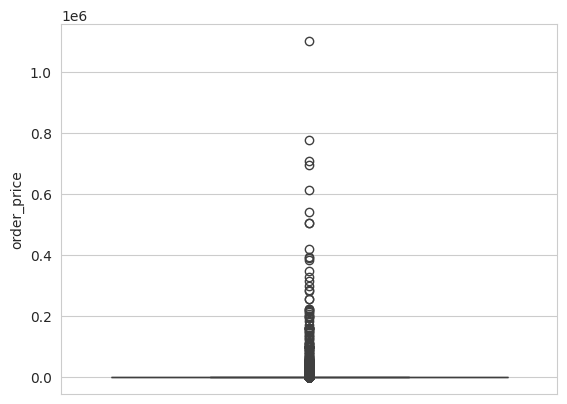

In [ ]:
# boxplot для данных в столбце "order_price"
sns.set_style('whitegrid')
sns.boxplot(y='order_price', data=orders)
plt.show()

###Датасет orders. Выводы:



* датасет orders содержит 18 столбцов и 73763 строк. Опишем самые интересные их них:
  * в поле, отражающем дату заказа order_date первое зарегистрированное действие выполнено 2021-01-01, а последнее 2024-03-18. На протяжении всего обозначенного периода происходит плавный рост количества заказов (с периодическими резкими скачками)
  * в поле с названиями точки контакта channel_id всего два категориальных, уникальных значения: "сайт" (в количестве 59453) и "административный сайт Mindbox" (в количестве 14310), что указывает на то, что пользователи совершали пожертвования посредством посещения сайта
  * в поле с внешним идентификатором точки контакта outer_channel_id так же два категориальных, уникальных значения: Site (59453), Administrator (14310)
  * в поле с названиями каналов channel_name аналогично два категориальных, уникальных значения: Сайт (59453), Администратор (14310)
  * в поле, содержащем информацию о стоимости заказа (он же размер пожертвования) order_price с минимальным значением равным 0 и максимумом в количестве 1100000. Где медианное значение равно 300, а среднее 937. Как мы можем видеть, 95 процентов заказов не более 3000. На сайте фонда есть несколько кнопок с фиксированной суммой пожертвования - 300, 500, 1500 и 3000, логично что основная масса доноров делает пожертвования в рамках этих сумм. Ориентируясь на дополнительно построенный boxplot можно сказать, что в диапазоне 400-800К всего 7 пожертвований и 1 пожертвование свыше 1млн
  * в поле recurrent, где указано реккурент ли пользователь отражена информация, что из всех 9039 (12% доноров) являются реккурентами, а 52272 нет (в 12452 строках информация пропущена)
  * в поле order_quantity указано количество приобретенных продуктов. Во всех случаях пожертвование состоит из 1 продукта
  * в поле order_status_id, отражающем статус позиции заказа 52058 факта пожертвования в статусе "paid", 14852 в статусе "notpaid" и 6853 в статусе "fail
  * из интересных взаимосвязей можно отметить сильную взаимосвязь поля repayment (повторный платеж) с полем order_status_id (индикатор статуса заказа) - 0.9. Так же обнаружена сильная взаимосвязь того же поля repayment с полями, содержащими информацию о величине пожертвования base_product_price,  order_price, order_price_line - от 0.8 до 1.0
  * количество уникальных пользователей - 21370.

###Отчет по датасету channels

In [ ]:
# формирование отчета по датасету channels
ProfileReport(channels, title='Report')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

###Датасет channels. Выводы:





* датасет channels содержит 8 столбцов и 2640001 строк. Опишем наиболее интересные из них:
  * в поле user_action описывается название действия пользователей. Всего 1752 уникальных действия, из которых наиболее популярными словами оказались "копия", "отправка", а самое популярное действие - "Переход на сайт"
  * в поле action_date, содержащем информацию о дате действия представлен временной диапазон, аналогичный датасету orders: 2021-01-01 - 2024-03-18, но фактически первые данные о каналах привлечения появляются в начале 2022 года
  * в поле channel_id, содержащем данные о названиях каналов привлечения большинство представлено каналом "email" (80%), затем по убыванию - "сайт" (13%) и административный сайт Mindbox (2,7%). Остальных каналов значительно меньше (около или менее 1%)
  * в поле action_time отражен час действия пользователя. Распределение частоты действий по часам напоминает нормальное, с наибольшей активностью в диапазоне 10 - 17 часов, что в принципе и логично. Но так же мы можем наблюдать два аномальных пика, приходящихся на 0 и 10 часов. Можно предположить, что такая активность могла поступать из регионов, чей часовой пояс имеет разницу с московским временем
  * количество уникальных пользователей - 23820


##Исследовательский анализ. Общие выводы

* глядя на все датасеты, можно сказать что большинство доноров не являются рекуррентами, то есть отправляют пожертвования не регулярно. Среди которых 14410 женщин и 4305 мужчин, в основном из таких городов как Вена, Москва и Санкт-Петербург, чаще всего электронная почта которых действительна. Наиболее распространенным часовым поясом является europe/moscow - 70% пользователей, далее с большим отрывом следуют asia/yekaterinburg, europe/samara, asia/krasnoyarsk 8-4%. Динамика регистраций/редактирования донорских профилей подвержена планомерному росту на протяжении периода 2021-01-01 - 2024-03-18. Вероятно большинство пользователей оформивших подписку, сделали это посредством электронной почты и как следствие мы наблюдаем взаимосвязь/корреляцию между параметрами email_invalid (валидна ли почта) и sub_email (подписка в точке контакта email)
* динамика активности по самим пожертвованиям тоже подвержена планомерному росту на протяжении аналогичного периода 2021-01-01 - 2024-03-18, в медианный и средний размеры которых 300 и 937 соответственно, а 95% платежей не превышают 3000 (на сайте фонда есть несколько кнопок с фиксированной суммой пожертвования - 300, 500, 1500 и 3000, логично что основная масса доноров делает пожертвования в рамках этих сумм). Но так же есть некоторые аномально высокие платежи, а именно в диапазоне 400-800К всего 7 пожертвований и 1 пожертвование свыше 1млн. Сами же платежи производились непосредственно посредством точки контакта "сайт". Если говорить о статусе платежа, то 52058 случаях они в статусе "paid", в 14852 - в статусе "notpaid" и 6853 - в статусе "fail". Так же можно отметить взаимосвязь столбца repayment (повторный платеж) со столбцами order_status_id (индикатор статуса заказа) и с полями, содержащими информацию о величине пожертвования base_product_price, order_price, order_price_line
* 2021-01-01 - 2024-03-18 - период, по которому мы располагаем информацией о каналах привлечения, но фактически первые данные появляются в начале 2022 года. Наиболее популярное действие - "переход на сайт". Из всех идентификаторов каналов привлечения большинство представлено индентификатором 3 ("email") (80%), затем по убыванию - 9 ("сайт") (13%) и 1 ("админитративный сайт Mindbox") (2,7%): Email, Сайт, Административный сайт Mindbox соответственно. Остальных каналов значительно меньше (около или менее 1%). Распределение частоты действий по часам напоминает нормальное, с наибольшей активностью в диапазоне 10 - 17 часов, что в принципе и логично. Но так же мы можем наблюдать два аномальных пика, приходящихся на 0 и 10 часов. Можно предположить, что такая активность могла поступать из регионов, время часового пояса которых имеет разницу с московским временем

#Аналитическая часть

##Пользовательские метрики исторического пользователя (донора)


In [ ]:
# определим в переменную old_id всех уникальных исторических пользователей
old_id = imports['old_customer_id'].unique()

In [ ]:
# взглянем на то, сколькими историческими пользователями мы вообще располагаем
print(f'Всего исторических пользователей - {len(old_id)}')

Всего исторических пользователей - 7343


*Зададим словарь с фактическими наименованием каналов, чтобы применить его для более корректной визуализации*

In [ ]:
names = {'3': 'Email', '1': 'Административный сайт Mindbox',
         '9': 'Сайт', '99': 'utm_term Не указан', '5': 'Прямой переход',
         '333': 'google.com', '1930': 'b24portal.dobroe-aif.ru',
         '54': 'org.telegram.messenger', '999': 'yandex.ru',
         '888': 'razovie', '30': 'instagram.com', '777': 'report',
         '132': 'yoomoney.ru', '10': 'vk.com', '444': 'first-stage',
         '8': 'WebPush', '222': 'vse', '555': 'roditeli', '300': 'ida',
         '100': 'ok.ru', '5120': 'congratulations', '111': 'lina'}

*И затем изучим датасет с действиями пользователей (channels) по признаку "историчности". Предварительно исключив все действия администратора сайта, id которого в поле channel_id - 1 и перекодировав id каналов в фактические названия*



In [ ]:
# исключим действия администратора
channels = channels.query('channel_id != 1')

In [ ]:
# определим переменную посредством срезов
channels_old_cust = channels.query('user_id in @old_id') # действия только исторических доноров

In [ ]:
# посмотрим на результат среза по историческим пользователям
channels_old_cust.head(2)

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time
0,Копия Фандрайзинговая. Максим Широкин,2022-12-20,3,NaN,NaN,NaN,2734,10
1,Копия Фандрайзинговая. Максим Широкин Не доста...,2022-12-20,3,NaN,NaN,NaN,2734,10


*Далее, определим тех исторических пользователей, которые потенциально активны, то есть совершали какое-либо действие в '24 году и тех которые ничего не совершали. Соответственно сделаем очередной срез в данных*

In [ ]:
# определим дату последнего действия по каждому донору
last_act = channels_old_cust.groupby('user_id')['action_date'].max().reset_index()
last_act.columns = ['user_id', 'last_action']
last_act.head(2)

,user_id,last_action
0,2734,2024-02-09
1,2847,2024-03-12


*Теперь получше взглянем на исторических пользователей в плоскости активности*

In [ ]:
# теперь взглянем получше только на исторических пользователей
old_id_no_act = last_act.query('last_action < "2024-01-01"')['user_id'] # выделим кто был активен только до '24 года
old_id_act = last_act.query('last_action >= "2024-01-01"')['user_id'] # и кто продолжил свою активность в '24

In [ ]:
# взглянем на то, сколько из исторических пользователей
print(f'Всего исторических пользователей, чья активность прекратилась до 2024 года - {len(old_id_no_act)}') # перестали проявлять активноть
print(f'Что от общей доли исторических пользователей составляет {round(len(old_id_no_act)/len(old_id)*100, 1)} %')
print()
print(f'Всего исторических пользователей, чья активность продолжилась в 2024 году - {len(old_id_act)}') # активны
print(f'Что от общей доли исторических пользователей составляет {round(len(old_id_act)/len(old_id)*100, 1)} %')

Всего исторических пользователей, чья активность прекратилась до 2024 года - 1873
Что от общей доли исторических пользователей составляет 25.5 %

Всего исторических пользователей, чья активность продолжилась в 2024 году - 5470
Что от общей доли исторических пользователей составляет 74.5 %


###Исторические пользователи, не активные в 2024 году

*Дадим описание тем историческим донорам, чья активность прекратилась в '24 году. Рекурренты ли они, какого пола, из каких городов, каким было их первое действие и по какому каналу. Предварительно приведя даты в более лаконичный вид и заменив условные id каналов на фактические наименования*

In [ ]:
# для удобства при дальнейших преобразованиях поменяем тип данных
channels['channel_id'] = channels['channel_id'].astype('str')
channels['channel_id'] = channels['channel_id'].map(names) # заменим id каналов на их названия

In [ ]:
# посмотрим на первое действие и канал, посредством которого оно произведено
chan_no_act = channels.query('user_id in @old_id_no_act').groupby('user_id')\
.agg({'action_date': ['min'], 'user_action': ['min'], 'channel_id': ['min']}).reset_index()
chan_no_act.columns = ['user_id', 'action_date', 'user_action', 'channel']
chan_no_act.head()

,user_id,action_date,user_action,channel
0,3361,2022-03-20,DOI. Welcome-письмо. Знакомство с фондом. Чере...,Email
1,6930,2022-03-20,RFM. Письмо 1,Email
2,7012,2022-03-20,RFM. Письмо 1,Email
3,7054,2022-03-20,RFM. Письмо 1,Email
4,7149,2022-03-20,RFM. Письмо 1,Email


*Визуализируем полученные характеристики*

In [ ]:
# отсечем для графиков только дату действия
chan_no_act['action_date'] = chan_no_act['action_date'].dt.date

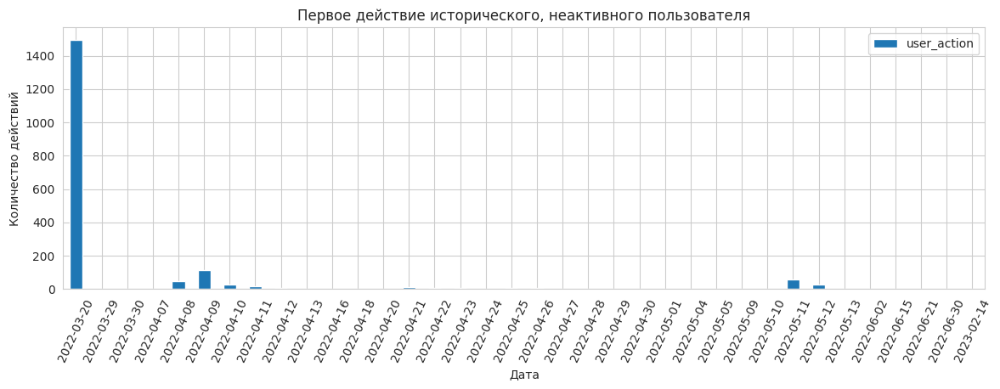

In [ ]:
# посмотрим на то, в какое время преимущественно были совершены первые действия от пользователей
chan_no_act.pivot_table(index='action_date', values='user_action', aggfunc='count')\
.plot(kind='bar', title='Первое действие исторического, неактивного пользователя',
      xlabel='Дата', ylabel='Количество действий', figsize=(14, 4), legend=True)
plt.xticks(rotation=65)
plt.show()

*Первое действие большинства целевых пользователей (около 1400 пользователей - наибольшая активность) было выполнено (появилось в системе) в марте 2022*

In [ ]:
# определим какие первые события наиболее популярны
chan_no_act.groupby('user_action')['user_id'].count().sort_values(ascending=False).reset_index()

,user_action,user_id
0,RFM. Письмо 1,1179
1,Импорт при переносе исторической базы клиентов,500
2,"Благодарность за поддержку, для тех от кого не...",52
3,Изменение Email,33
4,Изменение статуса заказа в операции Заказ - См...,28
5,Welcome-письмо. Знакомство с фондом. Через 2 дня,22
6,DOI. Welcome-письмо. Знакомство с фондом. Чере...,20
7,Изменение часового пояса клиентов при изменени...,8
8,Возврат рекуррентных подписок,7
9,Возврат рекуррентных подписок. Ноябрь,6


In [ ]:
# взглянем на положение дел с первым касанием в зависимости от канала
ch_id = chan_no_act.groupby('channel')['user_id'].count().sort_values(ascending=False).reset_index()
ch_id.columns = ['channel', 'count'] # для удобства агрегируем данные

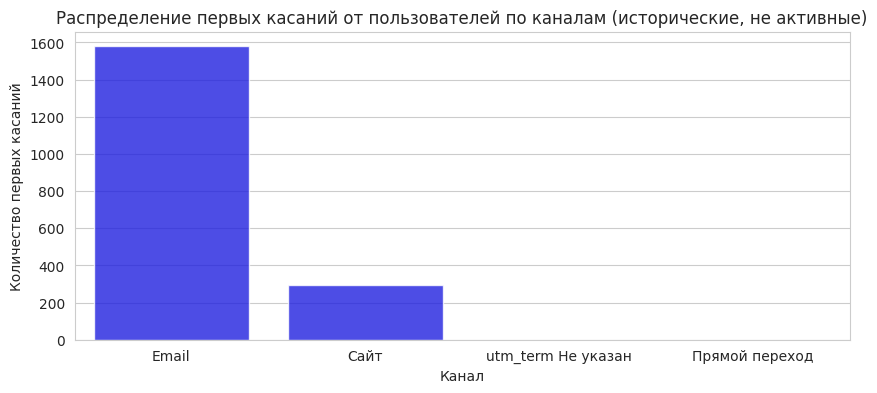

In [ ]:
# визуализируем полученные выше данные
f, ax = plt.subplots(figsize=(10, 4)) # построим столбчатую диаграмму
ax = sns.barplot(data = ch_id, x = 'channel', y = 'count', alpha=0.8, color='blue')
ax.set_xlabel('Канал')
ax.set_ylabel('Количество первых касаний')
ax.set_title('Распределение первых касаний от пользователей по каналам (исторические, не активные)')
plt.show()

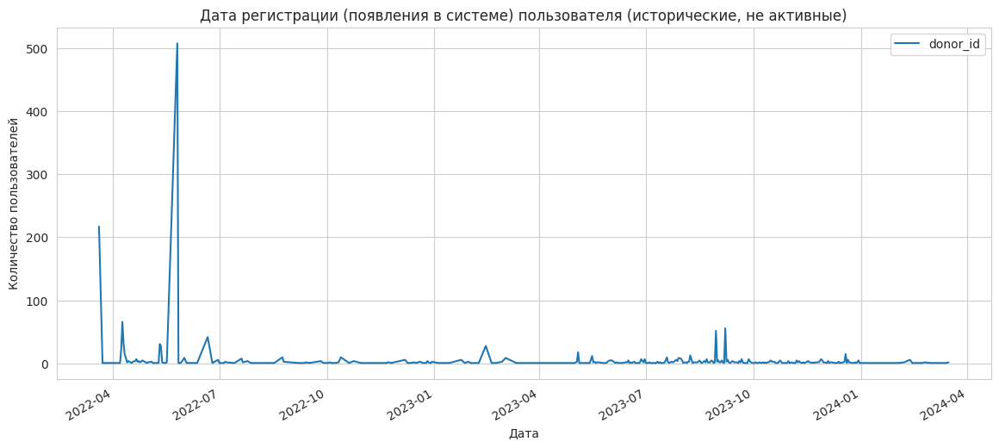

In [ ]:
# посмотрим на то, когда пользователь появился в системе (был загружен)
donors.query('donor_id in @old_id_no_act').pivot_table(index='reg_change_date_day', values='donor_id', aggfunc='nunique')\
.plot(title='Дата регистрации (появления в системе) пользователя (исторические, не активные)',
      xlabel='Дата', ylabel='Количество пользователей', grid=True, figsize=(14, 6), legend=True)
plt.show()

*Порядка 500 исторических, не активных пользователей было выгружено в систему в июле 2022*

In [ ]:
# определим преимущественно валидна ли почта пользователя
donors.query('donor_id in @old_id_no_act')['email_invalid'].value_counts()

email_invalid
False    1435
True      434
Name: count, dtype: int64

In [ ]:
# посмотрим на распределение пользователей в зависимости от региона
area_old_no_act = donors.query('donor_id in @old_id_no_act').groupby(['area_name']).agg({'donor_id':'nunique'}).reset_index()
area_old_no_act.sort_values(by='donor_id', ascending=False).head(10) # выведем топ-10 городов

,area_name,donor_id
9,Vienna,627
52,Москва,269
75,Санкт-Петербург,62
44,Краснодар,25
27,Екатеринбург,18
74,Самара,13
59,Новосибирск,12
57,Нижний Новгород,10
21,Владивосток,9
71,Ростов-на-Дону,8


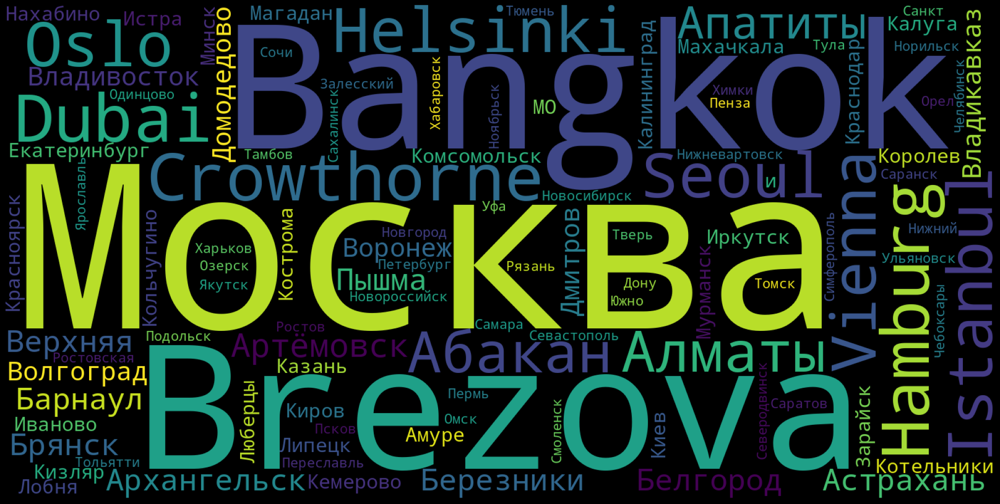

In [ ]:
# визуализируем информацию пользователей по регионам
text_raw = " ".join(area_old_no_act['area_name']) # для наглядности построим облако слов
wordcloud = WordCloud(width=1600, height=800, stopwords=['область', 'Республика', 'на']).generate(text_raw)
plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
# посмотрим на распределение пользователей в зависимости от пола
sex_old_no_act = donors.query('donor_id in @old_id_no_act').groupby(['sex']).agg({'donor_id':'nunique'}).reset_index()

In [ ]:
# визуализируем круговой диаграммой
fig = px.pie(sex_old_no_act, values='donor_id', names='sex', hole=.4)
fig.update_layout(
    title_text='Распределение исторических, не активных пользователей (по полу)',
    annotations=[dict(text='Гендер пользователя', x=0.5, y=0.5, font_size=13, showarrow=False)])
fig.show()

In [ ]:
# посмотрим на распределение пользователей в зависимости от того, рекуррент ли он
rec_old_no_act = donors.query('donor_id in @old_id_no_act').groupby(['recurrent']).agg({'donor_id':'nunique'}).reset_index().dropna()

In [ ]:
# визуализируем круговой диаграммой
fig = px.pie(rec_old_no_act, values='donor_id', names='recurrent', hole=.4)
fig.update_layout(
    title_text='Распределение исторических, не активных пользователей (рекуррент/не рекуррент)',
    annotations=[dict(text='Рекуррент или нет', x=0.5, y=0.5, font_size=14, showarrow=False)])
fig.show()

###Исторические пользователи, активные в 2024 (не вносят пожертвования)

*Теперь взглянем на тех исторических доноров, что продолжили активность в '24 году, но от которых не поступали пожертвования*

In [ ]:
# определенным образом выполним срез в датасете с информацией о пожертвованиях
don_act_no_pay = orders.query('customer_id in @old_id_act & order_date < "2024-01-01"')\
 ['customer_id'].unique() # определим индентификаторы пользователей

In [ ]:
# посчитаем сколько всего у нас таковых доноров
print('Всего не платящих доноров, чья активность продолжалась в 2024 году -', len(don_act_no_pay))

Всего не платящих доноров, чья активность продолжалась в 2024 году - 4109


In [ ]:
# посмотрим на первое действие и канал, посредством которого оно произведено
chan_act_no_pay = channels.query('user_id in @don_act_no_pay').groupby('user_id')\
.agg({'action_date': ['min'], 'user_action': ['min'], 'channel_id': ['min']}).reset_index()
chan_act_no_pay.columns = ['user_id', 'action_date', 'user_action', 'channel']
chan_act_no_pay.head()

,user_id,action_date,user_action,channel
0,2734,2022-03-20,RFM. Письмо 1,Email
1,2847,2022-03-20,DOI. Welcome-письмо. Знакомство с фондом. Чере...,Email
2,2861,2022-03-20,DOI. Welcome-письмо. Знакомство с фондом. Чере...,Email
3,4982,2022-03-20,DOI. Спасибо за разовое пожертвование,Email
4,6872,2022-03-20,RFM. Письмо 1,Email


*Аналогично, визуализируем полученные данные*

In [ ]:
# отсечем для графиков только дату действия
chan_act_no_pay['action_date'] = chan_act_no_pay['action_date'].dt.date

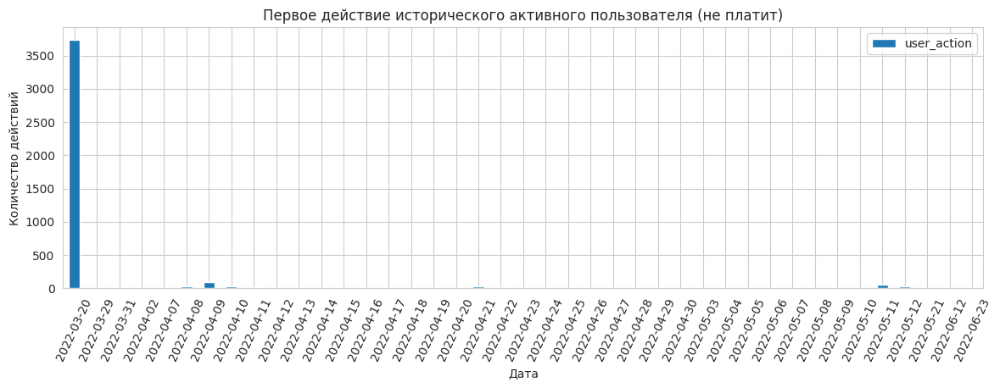

In [ ]:
# посмотрим на то, в какое время преимущественно были совершены первые действия от пользователей (занесли это действие в систему)
chan_act_no_pay.pivot_table(index='action_date', values='user_action', aggfunc='count')\
.plot(kind='bar', title='Первое действие исторического активного пользователя (не платит)',
      xlabel='Дата', ylabel='Количество действий', figsize=(14, 4), legend=True)
plt.xticks(rotation=65)
plt.show()

*Аналогично неактивным историческим, первое действие большинства целевых пользователей (около 3500 пользователей - наибольшая активность) было выполнено (появилось в системе) в марте 2022*

In [ ]:
# определим какие первые события наиболее популярны
chan_act_no_pay.groupby('user_action')['user_id'].count().sort_values(ascending=False)

user_action
RFM. Письмо 1                                                                             3412
Welcome-письмо. Знакомство с фондом. Через 2 дня                                           324
(копия, исправлено ТП) Спасибо за пожертвование. Новогодняя акция. 2                       147
DOI. Welcome-письмо. Знакомство с фондом. Через 2 дня                                       79
Благодарность за поддержку, для тех от кого не было действий до 30 дней                     41
Ежемесячный отчет для рекуррентов. Январь 2024                                              19
Возврат рекуррентных подписок. Ноябрь                                                       17
Импорт при переносе исторической базы клиентов                                              13
DOI. Спасибо за разовое пожертвование                                                       11
Благодарность через 3 месяца/через 6 месяцев/через год                                       7
DOI. Welcome-письмо. Знакомство с фонд

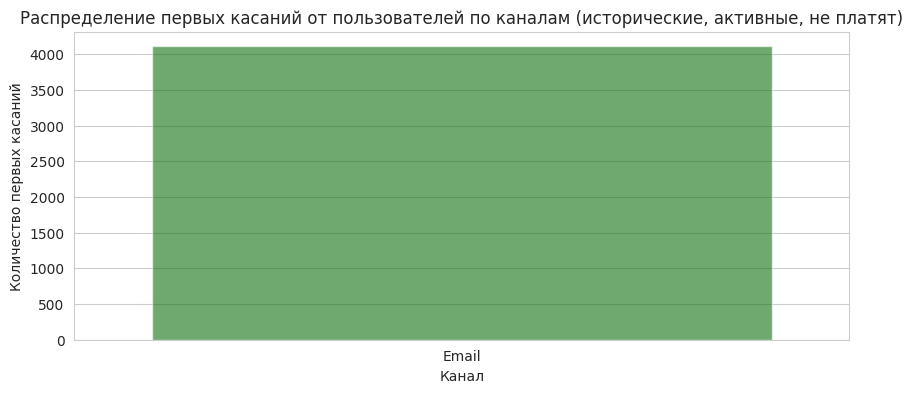

In [ ]:
# взглянем на положение дел с первым касанием в зависимости от канала
ch_id_np = chan_act_no_pay.groupby('channel')['user_id'].count().sort_values(ascending=False).reset_index()
ch_id_np.columns = ['channel', 'count'] # для удобства агрегируем данные

f, ax = plt.subplots(figsize=(10, 4)) # построим столбчатую диаграмму
ax = sns.barplot(data = ch_id_np, x = 'channel', y = 'count', alpha=0.6, color='green')
ax.set_xlabel('Канал')
ax.set_ylabel('Количество первых касаний')
ax.set_title('Распределение первых касаний от пользователей по каналам (исторические, активные, не платят)')
plt.show()

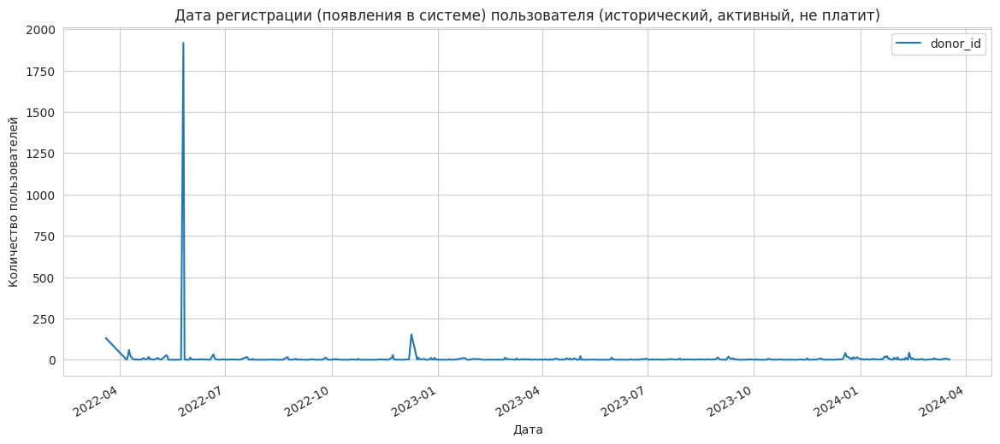

In [ ]:
# посмотрим на то, когда пользователь появился в системе (был загружен)
donors.query('donor_id in @don_act_no_pay').pivot_table(index='reg_change_date_day', values='donor_id', aggfunc='nunique')\
.plot(title='Дата регистрации (появления в системе) пользователя (исторический, активный, не платит)',
      xlabel='Дата', ylabel='Количество пользователей', grid=True, figsize=(14, 6), legend=True)
plt.show()

*Порядка 2000 исторических, активных, но не платящих пользователей было выгружено в систему в июле 2022 (аналогично историческим, не активным)*

In [ ]:
# определим преимущественно валидна ли почта пользователя
donors.query('donor_id in @don_act_no_pay')['email_invalid'].value_counts()

email_invalid
False    4080
True       29
Name: count, dtype: int64

In [ ]:
# посмотрим на распределение пользователей в зависимости от региона
area_old_act_np = donors.query('donor_id in @don_act_no_pay').groupby(['area_name']).agg({'donor_id':'nunique'}).reset_index()
area_old_act_np.sort_values(by='donor_id', ascending=False).head(10) # выведем топ-10 городов

,area_name,donor_id
9,Vienna,1567
75,Москва,728
118,Санкт-Петербург,148
65,Краснодар,52
41,Екатеринбург,51
85,Нижний Новгород,43
163,Южно-Сахалинск,39
88,Новосибирск,39
30,Владивосток,35
164,Якутск,28


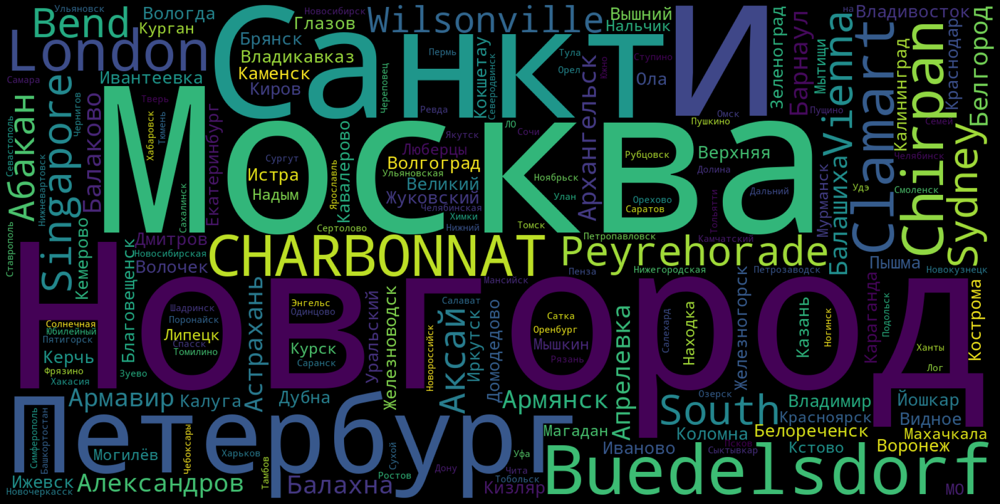

In [ ]:
# визуализируем информацию пользователей по регионам
text_raw = " ".join(area_old_act_np['area_name']) # для наглядности построим облако слов
wordcloud = WordCloud(width=1600, height=800, stopwords=['область', 'Республика']).generate(text_raw)
plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
# посмотрим на распределение пользователей в зависимости от пола
sex_old_act_np = donors.query('donor_id in @don_act_no_pay').groupby(['sex']).agg({'donor_id':'nunique'}).reset_index()

In [ ]:
# визуализируем круговой диаграммой
fig = px.pie(sex_old_act_np, values='donor_id', names='sex', hole=.4)
fig.update_layout(
    title_text='Распределение исторических, активных, не платящих пользователей (по полу)',
    annotations=[dict(text='Гендер пользователя', x=0.5, y=0.5, font_size=13, showarrow=False)])
fig.show()

In [ ]:
# посмотрим на распределение пользователей в зависимости от того рекуррент он или нет
rec_old_act_np = donors.query('donor_id in @don_act_no_pay').groupby(['recurrent']).agg({'donor_id':'nunique'}).reset_index().dropna()

In [ ]:
# визуализируем круговой диаграммой
fig = px.pie(rec_old_act_np, values='donor_id', names='recurrent', hole=.4)
fig.update_layout(
    title_text='Распределение исторических, активных, не платящих пользователей (рекуррент/не рекуррент)',
    annotations=[dict(text='Рекуррент или нет', x=0.5, y=0.5, font_size=14, showarrow=False)])
fig.show()

###Исторические пользователи, активные в 2024 (вносят пожертвования)

*Далее посмотрим на тех исторических доноров, что продолжили активность в '24 году и пожертвования от которых поступали*

In [ ]:
# определенным образом выполним срез в датасете с информацией о пожертвования и сохраним в переменную id доноров
don_act_pay = orders.query('customer_id in @old_id_act & order_date >= "2024-01-01" & order_price != 0 & order_status_id == "Paid"')\
 ['customer_id'].unique()

In [ ]:
# посчитаем сколько всего у нас таковых доноров
print('Всего платящих, исторических доноров, чья активность продолжалась в 2024 году -', len(don_act_pay))

Всего платящих, исторических доноров, чья активность продолжалась в 2024 году - 594


In [ ]:
# аналогично предыдущим, посмотрим на первое действие и канал, посредством которого оно произведено
chan_act_pay = channels.query('user_id in @don_act_pay').groupby('user_id')\
.agg({'action_date': ['min'], 'user_action': ['min'], 'channel_id': ['min']}).reset_index()
chan_act_pay.columns = ['user_id', 'action_date', 'user_action', 'channel']
chan_act_pay.head()

,user_id,action_date,user_action,channel
0,4982,2022-03-20,DOI. Спасибо за разовое пожертвование,Email
1,7079,2022-03-20,Welcome-письмо. Знакомство с фондом. Через 2 дня,Email
2,7735,2022-03-20,Welcome-письмо. Знакомство с фондом. Через 2 дня,Email
3,8059,2022-03-20,Welcome-письмо. Знакомство с фондом. Через 2 дня,Email
4,8064,2022-03-20,Welcome-письмо. Знакомство с фондом. Через 2 дня,Email


*Приступим к визуализации полученных данных*

In [ ]:
# отсечем для графиков только дату действия
chan_act_pay['action_date'] = chan_act_pay['action_date'].dt.date

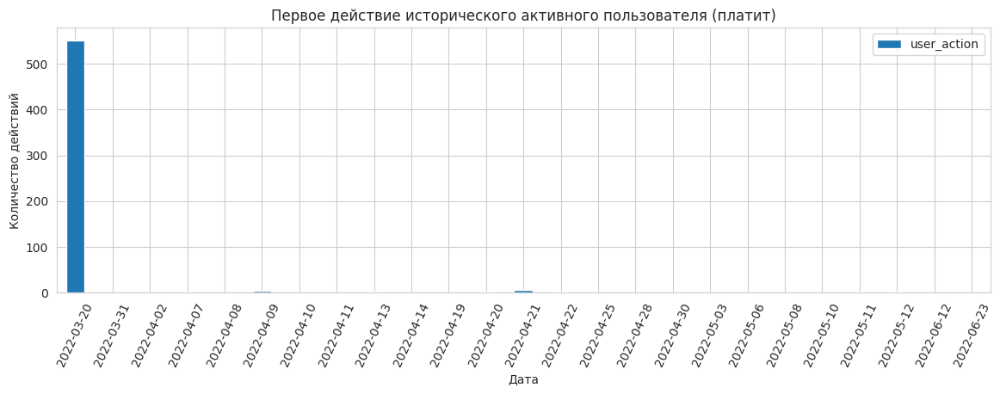

In [ ]:
# посмотрим на то, в какое время преимущественно были совершены первые действия от пользователей (занесли это действие в систему)
chan_act_pay.pivot_table(index='action_date', values='user_action', aggfunc='count')\
.plot(kind='bar', title='Первое действие исторического активного пользователя (платит)',
      xlabel='Дата', ylabel='Количество действий', figsize=(14, 4), legend=True)
plt.xticks(rotation=65)
plt.show()

*Первое действие большинства целевых пользователей (более чем 500 пользователей - наибольшая активность) было выполнено (появилось в системе) аналогично остальным историческим в марте 2022*

In [ ]:
# определим какие первые события наиболее популярны
chan_act_pay.groupby('user_action')['user_id'].count().sort_values(ascending=False)

user_action
Welcome-письмо. Знакомство с фондом. Через 2 дня                            268
RFM. Письмо 1                                                               185
(копия, исправлено ТП) Спасибо за пожертвование. Новогодняя акция. 2         88
DOI. Welcome-письмо. Знакомство с фондом. Через 2 дня                        33
DOI. Welcome-письмо. Знакомство с фондом. Через 2 дня. Новый шаблон           4
DOI. Спасибо за разовое пожертвование                                         4
Благодарность через 3 месяца/через 6 месяцев/через год                        4
DOI. Спасибо за разовое пожертвование. Новый шаблон                           2
DOI.Приглашение стать регулярным донором                                      2
DOI (копия, исправлено ТП) Спасибо за пожертвование. Новогодняя акция. 2      1
Благодарность за поддержку, для тех от кого не было действий до 30 дней       1
Возврат рекуррентных подписок                                                 1
Изменение статуса заказа в о

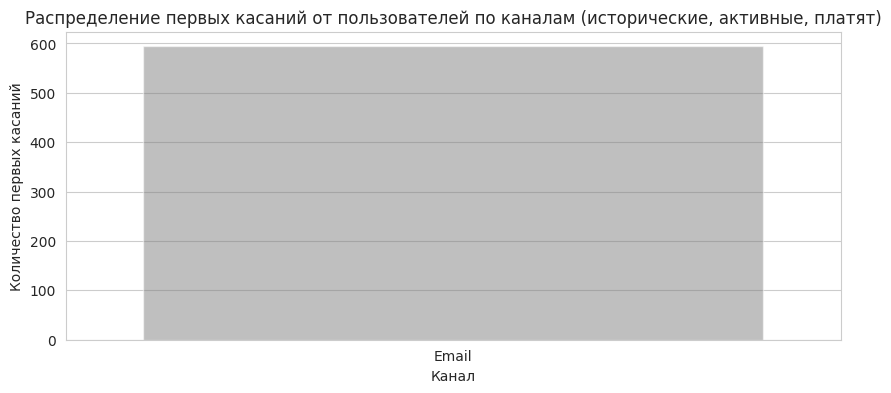

In [ ]:
# взглянем на положение дел с первым касанием в зависимости от канала
ch_id_p = chan_act_pay.groupby('channel')['user_id'].count().sort_values(ascending=False).reset_index()
ch_id_p.columns = ['channel', 'count'] # для удобства агрегируем данные

f, ax = plt.subplots(figsize=(10, 4)) # построим столбчатую диаграмму
ax = sns.barplot(data = ch_id_p, x = 'channel', y = 'count', alpha=0.5, color='gray')
ax.set_xlabel('Канал')
ax.set_ylabel('Количество первых касаний')
ax.set_title('Распределение первых касаний от пользователей по каналам (исторические, активные, платят)')
plt.show()

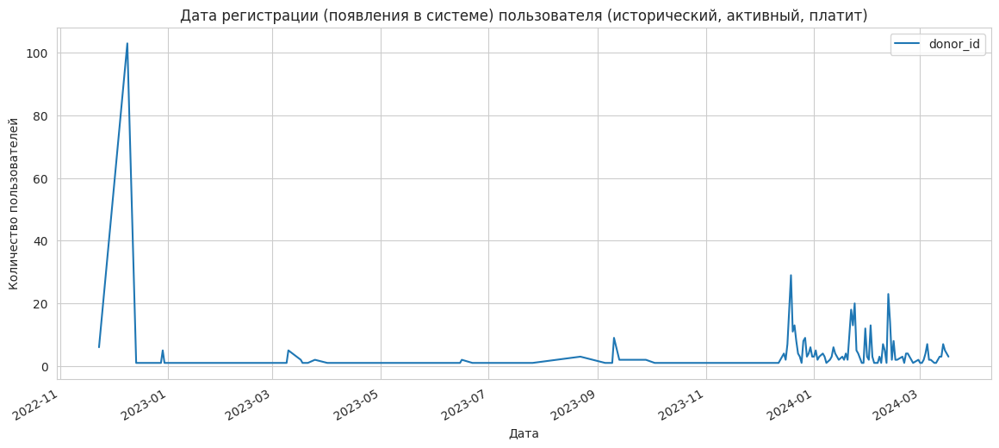

In [ ]:
# посмотрим на то, когда пользователь появился в системе (был загружен)
donors.query('donor_id in @don_act_pay').pivot_table(index='reg_change_date_day', values='donor_id', aggfunc='nunique')\
.plot(title='Дата регистрации (появления в системе) пользователя (исторический, активный, платит)',
      xlabel='Дата', ylabel='Количество пользователей', grid=True, figsize=(14, 6), legend=True)
plt.show()

*Порядка 100 исторических, активных и платящих пользователей было выгружено в систему в январе 2023 (в отличие от всех остальных исторических). Затем, с самого начала 2024 и на его протяжении наблюдается периодическая активность (видимо вносились некторые изменения в профили целевых пользователей)*

In [ ]:
# определим преимущественно валидна ли почта пользователя
donors.query('donor_id in @don_act_pay')['email_invalid'].value_counts()

email_invalid
False    585
True       9
Name: count, dtype: int64

In [ ]:
# посмотрим на распределение пользователей в зависимости от региона
area_old_act_p = donors.query('donor_id in @don_act_pay').groupby(['area_name']).agg({'donor_id':'nunique'}).reset_index()
area_old_act_p.sort_values(by='donor_id', ascending=False).head(10) # выведем топ-10 городов

,area_name,donor_id
1,Vienna,237
24,Москва,66
43,Санкт-Петербург,19
10,Екатеринбург,11
19,Краснодар,8
31,Новосибирск,7
29,Нижний Новгород,6
51,Хабаровск,5
14,Иркутск,4
40,Рязань,3


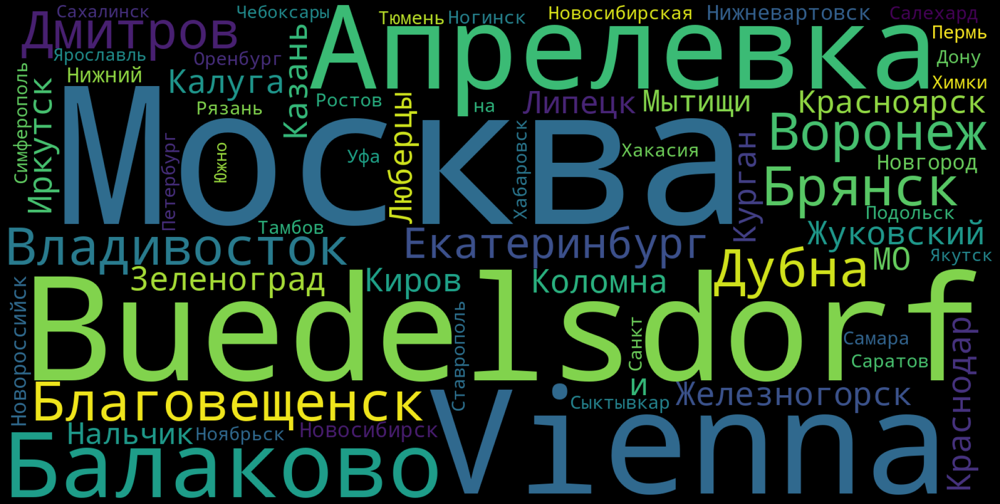

In [ ]:
# визуализируем информацию пользователей по регионам
text_raw = " ".join(area_old_act_p['area_name']) # для наглядности построим облако слов
wordcloud = WordCloud(width=1600, height=800, stopwords=['область', 'Республика']).generate(text_raw)
plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
# посмотрим на распределение пользователей в зависимости от пола
sex_old_act_p = donors.query('donor_id in @don_act_pay').groupby(['sex']).agg({'donor_id':'nunique'}).reset_index()

In [ ]:
# визуализируем круговой диаграммой
fig = px.pie(sex_old_act_p, values='donor_id', names='sex', hole=.4)
fig.update_layout(
    title_text='Распределение исторических, активных, платящих пользователей (по полу)',
    annotations=[dict(text='Гендер пользователя', x=0.5, y=0.5, font_size=13, showarrow=False)])
fig.show()

In [ ]:
# посмотрим на распределение пользователей в зависимости от того рекуррент он или нет
rec_old_act_p = donors.query('donor_id in @don_act_pay').groupby(['recurrent']).agg({'donor_id':'nunique'}).reset_index().dropna()

In [ ]:
# визуализируем круговой диаграммой
fig = px.pie(rec_old_act_p, values='donor_id', names='recurrent', hole=.4)
fig.update_layout(
    title_text='Распределение исторических, активных, платящих пользователей (рекуррент/не рекуррент)',
    annotations=[dict(text='Рекуррент или нет', x=0.5, y=0.5, font_size=14, showarrow=False)])
fig.show()

##Основные выводы по историческим пользователям

* исторический пользователь, чья активность была прекращена до '24 года имеет следующие характеристики. Всего данных пользователей 1873, что от общей доли исторических составляет 25.5 %. Подавляющее большинство которых совершили свое первое действие в марте 2022, чаще всего среди которых следующие: "RFM. Письмо" - 1179 фактов, "импорт при переносе исторической базы клиентов" - 500 фактов, "благодарность за поддержку, для тех от кого не было действий до 30 дней" - 52 факта. Первое касание которых в более чем 1500 случаях происходило через канал "Email" и в более чем 250 случаях через канал под "Cайт". Информация об основной массе пользователей была загружена в систему (датасета donors) в июле 2022. В большинстве случаев электронная почта неактивных, исторических пользователей является валидной. Из всех регионов, из которых данные пользователи, можно отметить Вену (33% пользователей), Москву (14%) и Санкт-Петербург (3%). В 75% случаев пользователь является женщиной, следовательно мужчин 25%. Так же 67% не активных исторических пользователей не рекурренты
* исторический пользователь, чья активность сохранилась в '24 году, но от кого не поступало пожертвований имеет следующие характеристики. Всего таких пользователей 4109, что от общей доли исторических составляет 55%. Подавляющее большинство которых совершили свое первое действие в марте 2022, чаще всего среди которых следующие: "RFM. Письмо" - 3412 фактов, "Welcome-письмо. Знакомство с фондом. Через 2 дня" - 324 факта и "(копия, исправлено ТП) Спасибо за пожертвование. Новогодняя акция. 2" - 147 фактов. Первое касание которых во всех 4109 случаях произведено через канал "Email".  Информация об основной массе пользователей была загружена в систему (датасета donors) в июле 2022. В большинстве случаев электронная почта неактивных, исторических пользователей является валидной. Из всех регионов, из которых данные пользователи, можно отметить Вену (38% пользователей), Москву (18%) и Санкт-Петербург (3%). В 73% случаев пользователь является женщиной, следовательно мужчин 27%. Так же 59% активных, не платящих исторических пользователей не рекурренты
* исторический пользователь, чья активность сохранилась в '24 году не только в виде каких-либо действий, а в том числе в виде пожертвований имеет следующие характеристики. Всего таких пользователей 594, что составляет 8% от общего количества исторических пользователей. Подавляющее большинство которых совершили свое первое действие в марте 2022, чаще всего среди которых следующие: "Welcome-письмо. Знакомство с фондом. Через 2 дня" - 268 фактов, "RFM. Письмо 1" - 185 фактов и "(копия, исправлено ТП) Спасибо за пожертвование. Новогодняя акция." - 88 фактов. Первое касание которых во всех 594 случаях произведено через канал "Email".  Информация об основной массе пользователей была загружена в систему (датасета donors) в январе 2023. В большинстве случаев электронная почта неактивных, исторических пользователей является валидной. Из всех регионов, из которых данные пользователи, можно отметить Вену (40% пользователей), Москву (11%) и Санкт-Петербург (3%). В 60% случаев пользователь является женщиной, следовательно мужчин 40%. Так же 60% активных, платящих исторических пользователей не рекурренты
* всего исторических пользователей 7343. Наиболее их заметные отличия. Как мы видим из исторических больше всего тех, кто сохранил активность, но не направляет пожертвования, в то время как сохранивших активность и направляющих пожертвования меньше остальных. Наиболее часто первое событие у исторических пользователь кто не активен и кто активен, но не делает пожертвования - "RFM. Письмо". В этом плане исторические пользователи, кто активен и вносит пожертвования отличились, наиболее частое первое их событие - "Welcome-письмо. Знакомство с фондом. Через 2 дня". Информация об исторических пользователях, тех кто прекратил активность до '24 года и тех, кто не прекратил ее, но не оформлял платежи была загружена в датасет orders в июле 2022, в том время как об исторических пользователях, чья активность и платежи имели место быть в '24 в январе 2023. Что указывает на единовременную загрузку данных о всех исторических пользователях. Среди всех исторических пользователей наиболее распространены следующие региона, по убыванию - Вена, Москва и Санкт-Петербург. Однако у пользователей, кто продолжил вносить пожертования в '24 наибольший процент доноров из Вены, наибольший процент мужчин (40%) по отношению к женщинам. Наименьшая доля рекуррентов обнаружена среди исторических пользователей, кто прекратил свою активность до '24 года (30%). Среди исторических пользователей, кто продолжил активность (40%), как среди вносящих пожертвования, так и не вносящих

##Пользовательские метрики нового пользователя (донора)

In [ ]:
# взглянем на то, сколькими новыми пользователями мы вообще располагаем
print('Всего новых пользователей -', len(donors.query('donor_id not in @old_id')))

Всего новых пользователей - 16477


*Опишем наиболее характерными параметрами новых пользователей. Начнем с того, какая была их самая первая активность и через какой канал*

In [ ]:
# определим переменную посредством срезов
channels_new_cust = channels.query('user_id not in @old_id') # действия только новых доноров
channels_new_cust.head(2) # выведем несколько строк

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time
438317,Счастливая история Анастасии Соловьевой,2023-02-14,Email,NaN,NaN,NaN,25240,15
438318,Счастливая история Анастасии Соловьевой Отправка,2023-02-14,Email,NaN,NaN,NaN,25240,15


In [ ]:
# посмотрим на первое действие и канал, посредством которого оно произведено
chan_new = channels_new_cust.groupby('user_id')\
.agg({'action_date': ['min'], 'user_action': ['min'], 'channel_id': ['min']}).reset_index()
chan_new.columns = ['user_id', 'action_date', 'user_action', 'channel']
chan_new.head()

,user_id,action_date,user_action,channel
0,25240,2023-02-14,RFM. Письмо 1,Email
1,25258,2022-04-08,Welcome-письмо. Знакомство с фондом. Через 2 дня,Email
2,25285,2022-04-08,Изменение статуса заказа в операции Заказ - См...,Email
3,25292,2022-04-08,Welcome-письмо. Знакомство с фондом. Через 2 дня,Email
4,25331,2022-04-08,Изменение статуса заказа в операции Заказ - См...,utm_term Не указан


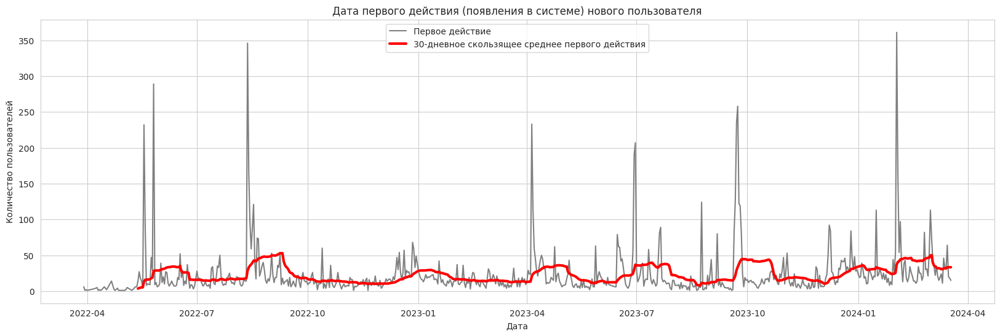

In [ ]:
# посмотрим на то, когда пользователь совершил свое первое действие (занесли это действие в систему)
plt.figure(figsize=(20,6))
sns.lineplot(chan_new.query('user_id not in @old_id').groupby('action_date')['user_id'].nunique(), label='Первое действие', color='gray')
sns.lineplot(chan_new.query('user_id not in @old_id').groupby('action_date')['user_id'].nunique()\
             .rolling(30).mean(), label='30-дневное скользящее среднее первого действия', color='red', linewidth=3)
# для снижения зашумленности гарфика добавили скользящее среднее
plt.title('Дата первого действия (появления в системе) нового пользователя')
plt.xlabel('Дата')
plt.ylabel('Количество пользователей')
plt.show()

*Первое действие новых пользователей было выполнено (появилось в системе) в диапазоне апрель 2022 - апрель 2024*

In [ ]:
# определим, какое первое действие было наиболее популярным
chan_new.groupby('user_action')['user_id'].count().sort_values(ascending=False)

user_action
DOI. Welcome-письмо. Знакомство с фондом. Через 2 дня                                     5573
DOI. Спасибо за разовое пожертвование                                                     3169
RFM. Письмо 1                                                                             2704
DOI. Спасибо за разовое пожертвование. Новый шаблон                                       2555
Добавление продукта в список в операции 'Добавление в список — Просмотренные продукты'     443
                                                                                          ... 
Клик — СМС                                                                                   1
Клик — Одноклассники                                                                         1
Дайджест новостей                                                                            1
Даша Семенова                                                                                1
Клик в попапе Попап-заглушка          

In [ ]:
# взглянем на положение дел с первым касанием в зависимости от канала
ch_new_id = chan_new.groupby('channel')['user_id'].count().sort_values(ascending=False).reset_index()
ch_new_id.columns = ['channel', 'count'] # для удобства агрегируем данные
ch_new_id # выведем результат

,channel,count
0,Email,16163
1,WebPush,162
2,Сайт,26
3,Прямой переход,9
4,utm_term Не указан,7
5,google.com,6
6,yandex.ru,4
7,b24portal.dobroe-aif.ru,1
8,first-stage,1
9,ida,1


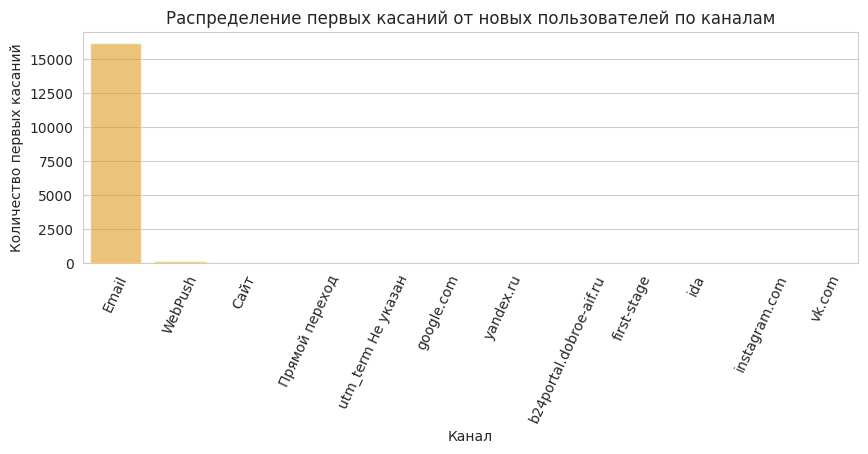

In [ ]:
# визуализируем посредством столбчатой диаграммы
f, ax = plt.subplots(figsize=(10, 4)) # построим столбчатую диаграмму
ax = sns.barplot(data = ch_new_id, x = 'channel', y = 'count', alpha=0.6, color='orange')
ax.set_xlabel('Канал')
ax.set_ylabel('Количество первых касаний')
ax.set_title('Распределение первых касаний от новых пользователей по каналам')
plt.xticks(rotation=65)
plt.show()

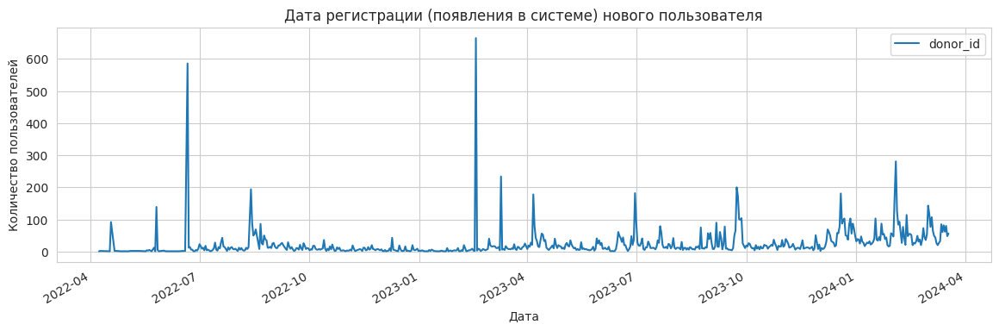

In [ ]:
# посмотрим на то, когда новый пользователь появился в системе (был загружен)
donors.query('donor_id not in @old_id').pivot_table(index='reg_change_date_day', values='donor_id', aggfunc='nunique')\
.plot(title='Дата регистрации (появления в системе) нового пользователя',
      xlabel='Дата', ylabel='Количество пользователей', grid=True, figsize=(14, 4), legend=True)
plt.show()

*Новые пользователи были выгружены в систему на протяжении периода апрель 2022 - арпель 2024 (с двумя заметным до 600 пользователей - август 2022 и апрель 2023)*

In [ ]:
# определим преимущественно валидна ли почта пользователя
donors.query('donor_id not in @old_id')['email_invalid'].value_counts()

email_invalid
False    14602
True      1455
Name: count, dtype: int64

In [ ]:
# определим то, сколько мы имеем пропусков, выполнив срез в данных по новым пользователям
donors.query('donor_id not in @old_id').isna().sum()

recurrent              11377
volunteer              16471
sex                     2619
area_name              16477
time_zone               6855
donor_id                   0
email_invalid            420
reg_change_date            0
subscriptions          16466
sub_sms                16466
sub_email                285
sub_viber              16466
sub_mobile_push        16466
sub_web_push           16107
reg_change_date_day        0
dtype: int64

*Как мы можем видеть данные о регионе пользователей полностью отсутствуют*

In [ ]:
# посмотрим на распределение пользователей в зависимости от пола
sex_new = donors.query('donor_id not in @old_id').groupby(['sex']).agg({'donor_id':'nunique'}).reset_index()

In [ ]:
# визуализируем круговой диаграммой
colors = ['darkorange', 'lightgreen']
fig = px.pie(sex_new, values='donor_id', names='sex', hole=.4)
fig.update_layout(
    title_text='Распределение новых пользователей (по полу)',
    annotations=[dict(text='Гендер пользователя', x=0.5, y=0.5, font_size=13, showarrow=False)])
fig.update_traces(textfont_size=15,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.show()

In [ ]:
# посмотрим на распределение пользователей в зависимости от того рекуррент или нет пользователь
rec_new = donors.query('donor_id not in @old_id').groupby(['recurrent']).agg({'donor_id':'nunique'}).reset_index()

In [ ]:
# визуализируем круговой диаграммой
colors = ['gold', 'mediumturquoise']
fig = px.pie(rec_new, values='donor_id', names='recurrent', hole=.4)
fig.update_layout(
    title_text='Распределение новых пользователей (рекуррент/не рекуррент)',
    annotations=[dict(text='Рекуррент или нет', x=0.5, y=0.5, font_size=14, showarrow=False)])
fig.update_traces(textfont_size=15,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.show()

##Основные выводы по новым донорам

* всего новых пользователей, информацией о которых мы обладаем - 16477, что является 69% от общего количества пользователей и они имеют следующие характеристики. Первое действие (дата совершения/внесения в систему) новых пользователей в диапазоне апрель 2022 - апрель 2024, с периодическими всплесками , но с большей частотой, на протяжении всего временного диапазона. Среди всех первых действий наиболее популярными у новых пользователей являются "DOI. Welcome-письмо. Знакомство с фондом. Через 2 дня" - 5573 факта, "DOI. Спасибо за разовое пожертвование" - 3169 фактов, "RFM. Письмо 1" - 2704 факта, "DOI. Спасибо за разовое пожертвование. Новый шаблон" - 2555 фактов и "Добавление продукта в список в операции 'Добавление в список — Просмотренные продукты'" - 443 факта. Как мы можем видеть наиболее популярны следующие каналы, через которые осуществлялись как раз те самые вышеупомянутые действия. "Email" - 16163 действия, "прямой переход" - 89 действий, "Web Push" - 85 действий и "Сайт" - 45 действий. Сама информация о пользователях так же загружалась в систему на протяженнии периода апрель 2022 - апрель 2024 (с периодическими, но постоянными высплесками, самые высокие - август 2022 и апрель 2023). Среди новых пользователей всего женщин 78%, мужчин соответственно 22%. Подавляющее большинство новых пользователей - 93%, рекуррентами не являются     

##Пользовательские метрики. Выводы

* всего исторических пользователей 7343, что составляет 31% от всех пользователей. Среди исторических больше тех, кто сохранил активность, но не отправляет пожертвования (активные, отправляющие пожертвования в меньшинстве). Канал, через который производилось первое действие "email". Среди тех, отправлял пожертвования в 2024 большая доля мужчин (40%), рекуррентов (40%) и пользователей из региона "Вена" по отношению в другим историческим пользователям
* всего новых пользователей, информацией о которых мы обладаем 16477, что является 69% от общего количества пользователей. Наиболее популярным каналом, через который осуществлялись первые действия - в подавляющем большинстве "email", но так же мы наблюдаем наличие таких каналов как "прямой переход", "Web Push" и "Сайт". Среди новых пользователей всего женщин 78%, мужчин соответственно 22%. Подавляющее большинство новых пользователей - 93%, рекуррентами не являются.

##RFM анализ

*Предварительно подготовим данные (датасет orders) для проведения RFM-анализа. Оставим только те строки, где указан статус платежа "Paid" в поле order_status_id, преобразуем поле с датой пожертвования, убрав время*

In [ ]:
# создадим соответствующий срез в данных датасета orders
rfm = orders.query('order_status_id == "Paid"')
rfm.order_date = rfm.order_date.dt.date # оставим только дуту в поле с датой платежа

In [ ]:
# для анализа дополнительно определим дату последнего действия
work_date = rfm.order_date.max() + pd.Timedelta('1d')
work_date

datetime.date(2024, 3, 19)

*Сгруппировав данные по пользователям, определим количество уникальных платежей, дату первого и последнего платежей и общую сумму пожертвований*

In [ ]:
# произведем некоторые агрегации для дальнейшей работы
rfm = rfm.groupby('customer_id').agg({'order_id':'count','order_date':['min','max'], 'order_price':'sum'}).reset_index()
rfm.columns = ['customer_id', 'order_count', 'first_date', 'last_date', 'total_sum']
rfm.sample(2)

,customer_id,order_count,first_date,last_date,total_sum
12108,37816,1,2023-05-07,2023-05-07,100
17162,44817,1,2024-02-02,2024-02-02,300


*В полученную rfm-таблицу добавим поле, где определим продолжительность "жизни" пользователя, а так же основые показатели для rfm-анализа*

In [ ]:
# и добавим поле "period", где отразим продолжительность "жизни" пользователя
rfm['period'] = ((rfm.last_date - rfm.first_date) / pd.Timedelta('1d') + 1).round(2)

In [ ]:
# recency, или время с момента последнего заказа
rfm['r_value'] = (work_date - rfm.last_date) / pd.Timedelta('1d')

In [ ]:
# frequency, или количество действий
rfm['f_value'] = (rfm.order_count / rfm.period).round(2)

In [ ]:
# monetary, или сумма всех покупок
rfm['m_value'] = rfm.total_sum

*Изначально проверим данные на наличие выбросов и только затем разделим их на ранги. Начнем с поля r_value*

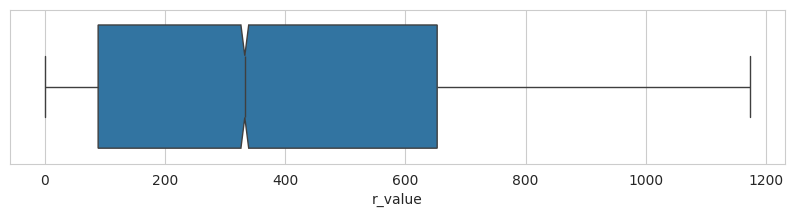

In [ ]:
# для этого воспользуемся визуализацией посредством boxplot
plt.figure(figsize=(10, 2))
sns.boxplot(x=rfm.r_value, notch=True) # проверим на наличие выбросов поле r_value
plt.show()

*В данных в поле r_value наличие выбросов обнаружено не было. Определим интервалы для разбиения столбца r_value на три ранга*

In [ ]:
# создадим переменную с интервалами
r_bins = [0, 11, 56, 1173.5020833333333]
r_bins

[0, 11, 56, 1173.5020833333333]

In [ ]:
# создадим новый столбец с рангов, разбив поле r_value на три равных интервала
r_labels = [3, 2, 1] # ярлыки для рангов
rfm['R'] = pd.cut(rfm.r_value, labels=r_labels, bins=r_bins, include_lowest=True)

*Теперь проверим на выбросы и разобьем на ранги столбец f_value*

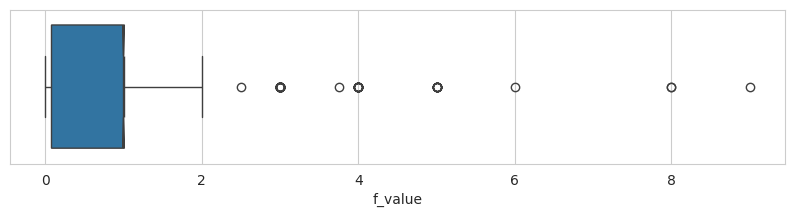

In [ ]:
# проверим на наличие выбросов поле f_value
plt.figure(figsize=(10, 2))
sns.boxplot(x=rfm.f_value, notch=True)
plt.show()

*Как мы можем видеть, в поле f_value обнаружены аномальные значения. Подчистим данные*

In [ ]:
# чистим данные от выбросов через интерквартильный размах
fq1, fq3 = np.percentile(rfm.f_value, [25, 75])
f_iqr = fq3 - fq1
f_top = fq3 + 1.5 * f_iqr
f_clean = rfm[rfm.f_value < f_top]['f_value'].tolist()

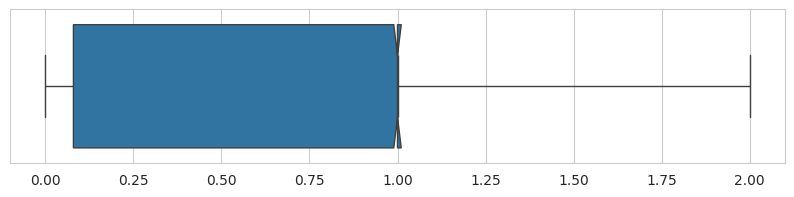

In [ ]:
# повторно оценим характер полученных данных
plt.figure(figsize=(10, 2))
sns.boxplot(x=f_clean, notch=True)
plt.show()

*Определим интервалы для разбиения столбца f_value на три ранга*

In [ ]:
# создадим переменную с интервалами
f_bins = [0, 0.245, 0.37, 2]
f_bins

[0, 0.245, 0.37, 2]

In [ ]:
# создадим новый столбец с рангов, разбив поле f_value на три равных интервала
f_labels = [1, 2, 3] # ярлыки для рангов
rfm['F'] = pd.cut(rfm.f_value, labels=f_labels, bins=f_bins, include_lowest=True)

*Проверим на выбросы и разобьем на ранги столбец m_value*

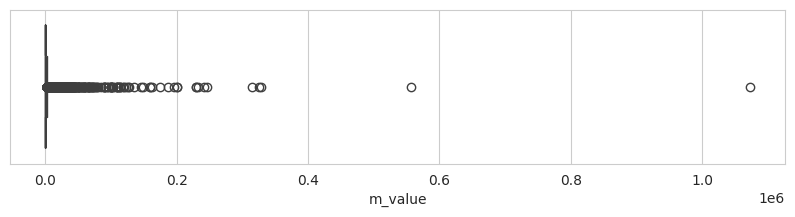

In [ ]:
# проверим на наличие выбросов поле m_value
plt.figure(figsize=(10, 2))
sns.boxplot(x=rfm.m_value, notch=True)
plt.show()

*Как мы можем видеть, в поле m_value обнаружены аномальные значения. Подчистим данные*

In [ ]:
# чистим данные от выбросов через интерквартильный размах
mq1, mq3 = np.percentile(rfm.m_value, [25, 75])
m_iqr = mq3 - mq1
m_top = mq3 + 1.5 * m_iqr
m_clean = rfm[rfm.m_value < m_top]['m_value'].tolist()

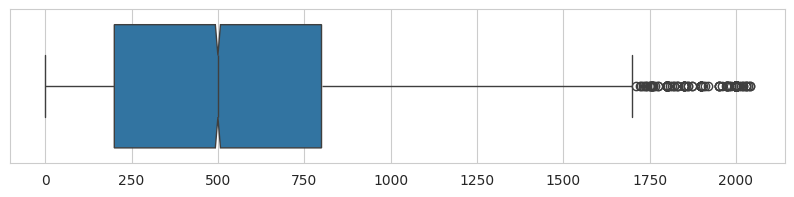

In [ ]:
# повторно оценим характер полученных данных
plt.figure(figsize=(10, 2))
sns.boxplot(x=m_clean, notch=True)
plt.show()

*Определим интервалы для разбиения столбца m_value на три ранга*

In [ ]:
# создадим переменную с интервалами
m_bins = [0, 300, 500, 2040]
m_bins

[0, 300, 500, 2040]

In [ ]:
# создадим новый столбец с рангами, разбив поле m_value на три равных интервала
m_labels = [1, 2, 3] # ярлыки для рангов
rfm['M'] = pd.cut(rfm.m_value, labels=m_labels, bins=m_bins, include_lowest=True)

*Определим итоговый сегмент RFM, сложив все три ранга*

In [ ]:
rfm['RFM'] = rfm.R.astype('str') + rfm.F.astype('str') + rfm.M.astype('str')
rfm.head(4) # отобразим полученный результат

,customer_id,order_count,first_date,last_date,total_sum,period,r_value,f_value,m_value,R,F,M,RFM
0,2734,2,2021-03-18,2021-10-14,51,211.0,887.0,0.01,51,1,1,1,111
1,2847,3,2021-06-16,2023-12-15,1000,913.0,95.0,0.00,1000,1,1,3,113
2,2861,7,2021-03-16,2022-12-07,120,632.0,468.0,0.01,120,1,1,1,111
3,3361,1,2022-12-20,2022-12-20,3000,1.0,455.0,1.00,3000,1,3,NaN,13nan


*Далее добавим описание всех рангов и далее полученных нами сегментов*

|Ранг|R (время отсутствия)|F (частота заходов)|M (количество денег)|
|---|---|---|---|
|1|был более 56 дней назад|заходит не чаще 0.245 раз в день|заплатил менее 300 рублей|
|2|был от 11 до 56 дней назад|заходит от 0.245 до 0.37 раз в день|заплатил от 300 до 500 рублей|
|3|был менее 11 дней назад|заходит чаще 0.37 раз в день|заплатил более 500 рублей|

|Сегмент|Тип клиента|
|---|---|
|333|**Ключевой**|
||-платили недавно|
||-платят часто|
||-платят много|
|332, 331, 322|**Лояльный**|
||-платили недавно|
||-платят часто или средне|
||-платят не очень много|
|323, 233, 223|**Крупный**|
||-платят редко|
||-платят много||
|232, 231, 222, 221, 212, 211|**Неактивный**
||-давно не платят|
|213, 133, 123, 113|**Крупный, неактивный**|
||-платили давно|
||-платят много|
|321, 313, 312, 311	|**Новый**|
||-недавно платили впервые|
|132, 131, 122, 121|**Почти ушедший**|
||-в прошлом много платили|
||-давно не платили|
|112, 111|**Ушедший**|
||-платили давно|
||-платили редко|
||-платили не много|

*Теперь создадим посредством функции столбец, где присвоим каждому пользователю определенный сегмент*

In [ ]:
# напишем функцию seg
def seg(row: str) -> str:
  new_row = ''
  if row in ['333']:
    new_row = 'ключевой'
  elif row in ['332', '331', '322']:
    new_row = 'лояльный'
  elif row in ['323', '233', '223']:
    new_row = 'крупный'
  elif row in ['232', '231', '222', '221', '212', '211']:
    new_row = 'не активный'
  elif row in ['213', '133', '123', '113']:
    new_row = 'крупный, не активный'
  elif row in ['321', '313', '312', '311']:
    new_row = 'новый'
  elif row in ['132', '131', '122', '121']:
    new_row = 'почти ушедший'
  else:
    new_row = 'ушедший'
  return new_row

In [ ]:
# применим написанную функцию и выведем результат
rfm['segment'] = rfm.RFM.apply(seg)
rfm.sample(2)

,customer_id,order_count,first_date,last_date,total_sum,period,r_value,f_value,m_value,R,F,M,RFM,segment
9083,32541,4,2022-12-15,2023-03-30,400,106.0,355.0,0.04,400,1,1,2,112,ушедший
6722,28331,1,2022-06-20,2022-06-20,5000,1.0,638.0,1.00,5000,1,3,NaN,13nan,ушедший


*Посмотрим на некоторые характеристики и особенности, свойственные тому или иному сегменту (численность пользователей, сумма пожертвований и средняя продолжительность "жизни")*

In [ ]:
# группируем данные по признаку сегмента
rfm.groupby('segment').agg({'customer_id':'nunique', 'total_sum':'sum',
                            'period':'mean'}).reset_index().rename(columns={'customer_id':'customers_count','total_sum':'income',
                                                                            'period':'life_mean'})

,segment,customers_count,income,life_mean
0,ключевой,32,35142,1.406250
1,крупный,304,360944,1.342105
2,"крупный, не активный",4258,4882987,132.335369
3,лояльный,209,60220,1.287081
4,не активный,1291,401169,28.629744
5,новый,289,257270,253.581315
6,почти ушедший,8796,2596064,1.025807
7,ушедший,3542,30112872,328.529927


*Для удобства дальнейшей работы с полученными сегментами, выделим отдельно под загрузку только информацию о пользователе и его сегменте*

In [ ]:
# выгрузка файла с сегментами пользователей
rfm[['customer_id', 'segment']].to_excel('rfm_users.xlsx')

##RFM-анализ. Выводы

* по итогу проведенного rfm-анализа было получено 8 сегментов, а именно следующие: ключевой, лояльный, крупный, неактивный, крупный неактивный, новый, почти ушедший, ушедший
* сегменты "ушедший" и "почти ушедший" представлены 3542 и 8796 пользователями, общая сумма пожертвований от которых 30112872 и 2596064, со средней продолжительностью "жизни" 328 и 1 день соответственно. На данный момент на этот сегмент не стоит тратить много усилий и внимания, либо сделать это в последнюю очередь. Можно предложить какие-либо акции и предожить оценить какие-то нововведения, которые этот сегмент мог упустить
* сегменты "не активный" и "крупный, не активный" представлены 1291 и 4258 пользователями, общая сумма пожертвований от которых 401169 и 4882987, со средней продолжительностью "жизни" 28 и 132 соответственно. Эти пользователи уже более перспективны к "оживлению". Можно предложить скидку и обязательно собрать обратную связь, чтобы в дальнейшем снизить вероятность пополнения этого сегмента новыми пользователями
* сегменты "крупный" и "лояльный" представлены 304 и 209 пользователями, общая сумма пожертвований от которых 360944 и 60220, со средней продолжительностью "жизни" 1.3 и 1.2 дней соответственно. Очень ценные сегменты пользователей. Вместо скидок и каких-либо акций предложить какой-нибудь подарок или персонализированные услуги
* сегмент "новый" представлен 289 пользователями, общая сумма пожертвований от которого 257270, со средней продолжительностью "жизни" 253 дня. Это совсем недавние пользователи, поэтому важно будет замотивировать их продолжить сотрудничество. Например можно дополнительно поблагодарить их за выбор, а так же предложить подписаться на социальные сети
* сегмент "ключевой" представлен 32 пользователями, общая сумма пожертвований от которого 35142, со средней продолжительностью "жизни" 1.4 дня. Это самые идеальные доноры, так что важно показать им их ценность. Например можно попросить оставить отзыв и предложить персонализированные услуги

##Коммерческие метрики

###Средний чек. Динамика среднего чека. Средний чек по акциям

*Определим средний чек и его динамику, разбив пользователей на сегменты, полученные в результате rfm-анализа*

In [ ]:
# определим в общем средний чек по всем акциям
print(f'Общий средний чек - {orders.order_price.mean().round(2)}')

Общий средний чек - 937.88


In [ ]:
# добавим в датасет с пожертвованиями столбец с сегментами пользователей
ords_rfm = orders.merge(rfm[['customer_id', 'segment']], how='left', on='customer_id')
ords_rfm.order_date = ords_rfm.order_date.dt.date # отсечем от даты время
ords_rfm.sample(2) # оценим результат

,order_id,action_id,order_date,channel_id,outer_channel_id,channel_name,order_price,order_web_id,order_ny,recurrent,repayment,product_web_id,product_name,order_quantity,base_product_price,order_price_line,order_status_id,customer_id,segment
30950,82549,135595,2022-05-18,9,Site,Сайт,0,18962,False,False,NaN,16963,Пожертвование Благотворительный фонд «АиФ. Доб...,1,200.0,200,fail,27176,почти ушедший
57370,120131,102131543,2023-07-01,9,Site,Сайт,120,101044,False,False,NaN,99945,Пожертвование Благотворительный фонд «АиФ. Доб...,1,120.0,120,Paid,39068,ушедший


*Взглянем на средний чек и его динамику вообщем, а так же в зависимости от сегмента*

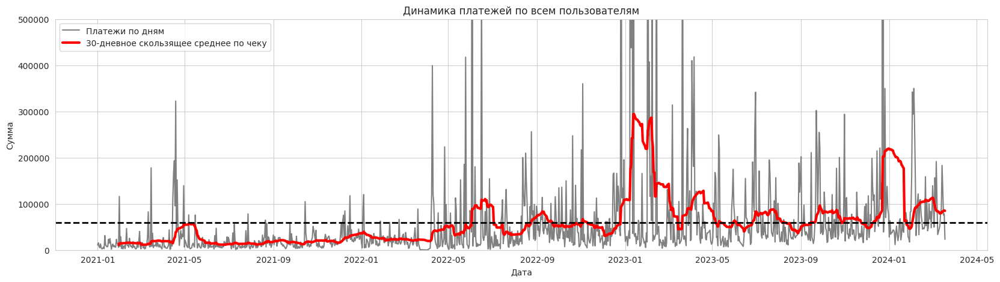

In [ ]:
# посмотрим на динамику платежей по дням, по всем пользователям
plt.figure(figsize=(20, 5))
sns.lineplot(ords_rfm.groupby('order_date')['order_price'].sum(), label='Платежи по дням', color='gray')
sns.lineplot(ords_rfm.groupby('order_date')['order_price'].sum()\
             .rolling(30).mean(), label='30-дневное скользящее среднее по чеку', color='red', linewidth=3) # добавим 30-дневное скользящее среднее
plt.axhline(y=ords_rfm.groupby('order_date')['order_price'].sum().mean(),
            linestyle='--', label='Средний чек', color='black', linewidth=2) # добавим линию, отражающую вообщем средний дневной чек
plt.ylim([0, 500000]) # сократим диапазон платежей, чтобы лучше рассмотреть среднюю динамику
plt.title('Динамика платежей по всем пользователям')
plt.xlabel('Дата')
plt.ylabel('Сумма')
plt.show()

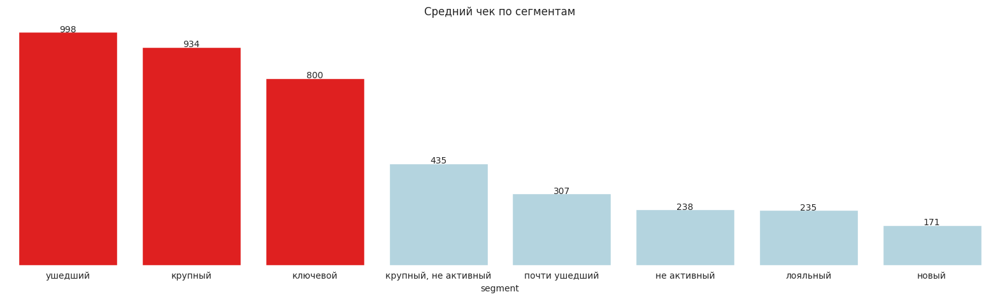

In [ ]:
# определим величину среднего чека в зависимости от сегмента
plt.figure(figsize=(20, 5))

mean_price = ords_rfm.groupby('segment')['order_price'].mean().sort_values(ascending=False).reset_index()
m_pr = mean_price.order_price.tolist()
colors = ['lightblue'] * 8
colors[0], colors[1], colors[2] = 'red', 'red', 'red' # зададим цветовую гамму графика, выделим топ-3
sns.barplot(mean_price, x='segment', y='order_price', palette=colors) # построим столбчатую диаграмму

for i in range(len(m_pr)):
        plt.text(i, m_pr[i], int(m_pr[i]), horizontalalignment='center') # добавим подписи над барами

ax = plt.gca ()
ax.get_yaxis().set_visible(False) # исключим ось y

for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False) # уберем рамки

plt.title('Средний чек по сегментам')
plt.show()

*Взглянем на динамику средних чеков наиболее интересных нам сегментов пользователей. В этом плане отметим сегменты с наибольшим средним чеком "крупный", "ключевой", "ушедший", а также интересный в плане перспектив сегмент "новый"*

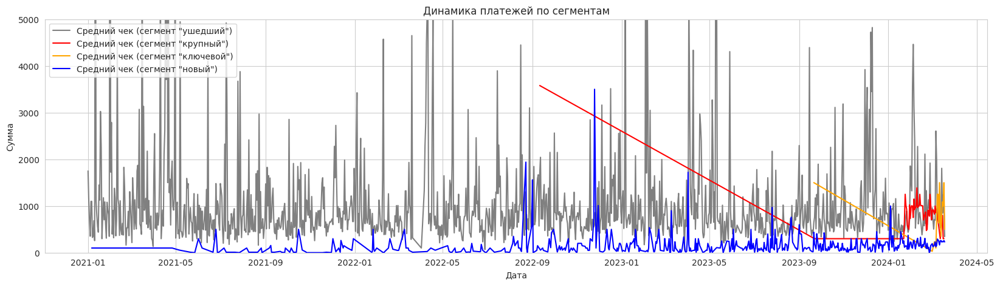

In [ ]:
# посмотрим на динамику платежей по дням, по определенным сегментам
plt.figure(figsize=(20, 5))

sns.lineplot(ords_rfm.query('segment == "ушедший"').groupby('order_date')['order_price'].mean()\
             , label='Средний чек (сегмент "ушедший")', color='gray') # график по сегменту "почти ушедший"
sns.lineplot(ords_rfm.query('segment == "крупный"').groupby('order_date')['order_price'].mean()\
             , label='Средний чек (сегмент "крупный")', color='red') # график по сегменту "крупный"
sns.lineplot(ords_rfm.query('segment == "ключевой"').groupby('order_date')['order_price'].mean()\
             , label='Средний чек (сегмент "ключевой")', color='orange') # график по сегменту "ключевой"
sns.lineplot(ords_rfm.query('segment == "новый"').groupby('order_date')['order_price'].mean()\
             , label='Средний чек (сегмент "новый")', color='blue') # график по сегменту "новый"

plt.ylim([0, 5000]) # сократим диапазон платежей, чтобы лучше рассмотреть среднюю динамику
plt.title('Динамика платежей по сегментам')
plt.xlabel('Дата')
plt.ylabel('Сумма')
plt.show()

###Главный (первый) источник входа для пользователей (по сегментам)

*Определим главный (первый источник входа) по каждому из сегментов*

In [ ]:
# добавим к датасету с действиями поле с обозначением сегмента пользователя
seg_chan = channels.merge(rfm[['customer_id', 'first_date', 'segment']], left_on='user_id',
                          right_on='customer_id', how='left').drop('customer_id', axis=1)
seg_chan.head(2) # и результат

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time,first_date,segment
0,Копия Фандрайзинговая. Максим Широкин,2022-12-20,Email,NaN,NaN,NaN,2734,10,2021-03-18,ушедший
1,Копия Фандрайзинговая. Максим Широкин Не доста...,2022-12-20,Email,NaN,NaN,NaN,2734,10,2021-03-18,ушедший


In [ ]:
# затем посмотрим на то, по какому каналу была первая активность в том или ином сегменте
top_chan = seg_chan.pivot_table(index=['segment', 'channel_id', 'first_date'], values='user_id', aggfunc='nunique').reset_index()
top_chan = top_chan.drop('first_date', axis=1) # удалим ненужный столбец

In [ ]:
# оставим только информацию о сегментах, каналах и количестве пользователей
top_chan_ag = top_chan.groupby(['segment','channel_id']).agg({'user_id':'count'}).sort_values('user_id', ascending=False).reset_index()
top_chan_ag.columns = ['segment', 'channel_id', 'users_count']
top_chan_ag.head()

,segment,channel_id,users_count
0,почти ушедший,Email,957
1,почти ушедший,Сайт,949
2,ушедший,Email,945
3,ушедший,Сайт,943
4,"крупный, не активный",Email,934


In [ ]:
# продемострируем выведенные выше данные
plt.figure(figsize=(20, 10))
fig = px.bar(top_chan_ag, x='channel_id', y='users_count', color='segment')
fig.update_layout(title = 'Главный источник входа (сегменты)',
                  xaxis_title = 'Каналы привлечения',
                  yaxis_title = 'Количество пользователей')
fig.show()

<Figure size 2000x1000 with 0 Axes>

###Активность пользователей по дням недели/часам

*Для начала нам необходимо создать дополнительный столбец, содержащий в себе информацию о дне недели совершенного действия*

In [ ]:
# воспользуемся бибилиотекой datetime
seg_chan['day_of_week'] = seg_chan.action_date.dt.day_of_week + 1
seg_chan.head(2) # и проверим что получилось

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time,first_date,segment,day_of_week
0,Копия Фандрайзинговая. Максим Широкин,2022-12-20,Email,NaN,NaN,NaN,2734,10,2021-03-18,ушедший,2
1,Копия Фандрайзинговая. Максим Широкин Не доста...,2022-12-20,Email,NaN,NaN,NaN,2734,10,2021-03-18,ушедший,2


In [ ]:
# определим уровень активности пользователей в зависимости от дня недели
chan_act_day = seg_chan.groupby(['day_of_week', 'segment']).agg({'user_action':'count'}).sort_values('day_of_week', ascending=True).reset_index()
chan_act_day['day_of_week'] = chan_act_day['day_of_week'].astype('str')
chan_act_day.head(2) # и результат

,day_of_week,segment,user_action
0,1,ключевой,118
1,1,крупный,1940


In [ ]:
# создадим словарь с перечнем дней недели для удобства на графике
days = {'1':'Monday', '2':'Tuesday', '3':'Wednesday', '4':'Thursday', '5':'Friday', '6':'Saturday', '7':'Sunday'}

In [ ]:
# заменим цифры на названия дней недели
chan_act_day['day_of_week'] = chan_act_day['day_of_week'].map(days)

In [ ]:
chan_act_day.head()

,day_of_week,segment,user_action
0,Monday,ключевой,118
1,Monday,крупный,1940
2,Monday,"крупный, не активный",80430
3,Monday,лояльный,566
4,Monday,не активный,8295


In [ ]:
# визуализируем полученные данные
plt.figure(figsize=(20, 10))
fig = px.bar(chan_act_day, x='day_of_week', y='user_action', color='segment')
fig.update_layout(title = 'Активность по дням недели (сегменты)',
                  xaxis_title = 'День недели',
                  yaxis_title = 'Уровень активности пользователей')
fig.show()

<Figure size 2000x1000 with 0 Axes>

In [ ]:
# определим уровень активности пользователей в зависимости от конкретного часа
chan_act_hour = seg_chan.groupby(['action_time', 'segment']).agg({'user_action':'count'}).sort_values('user_action', ascending=False).reset_index()
chan_act_hour.head(2) # и результат

,action_time,segment,user_action
0,0,почти ушедший,160674
1,10,почти ушедший,149908


In [ ]:
# визуализируем полученные выше данные
plt.figure(figsize=(20, 10))
fig = px.bar(chan_act_hour, x='action_time', y='user_action', color='segment')
fig.update_layout(title = 'Активность по часам (сегменты)',
                  xaxis_title = 'Часы',
                  yaxis_title = 'Уровень активности пользователей')
fig.show()

<Figure size 2000x1000 with 0 Axes>

*Как мы можем видеть, активность в зависимости от часа суток имеет некоторые особенности. Можем наблюдать два пика, в районе полуночи и в районе 10 часов утра по Москве. Мы можем предположить, что активность в 10 часов утра связана с началом рабочего дня у большинства пользователей, а вот причины аномальной активности в полночь установим отдельно. Изначально предположим, что наблюдаемая активность исходит от пользователей-рекуррентов, за счет одновременного списания средств*

In [ ]:
# определим пользователей, чья активность приходилась на полночь
users_night = channels.query('action_time == 0')['user_id'].unique().tolist()

In [ ]:
# далее определим, которая доля от этих пользователей является рекуррентами
users_night_rec = donors[donors.donor_id.isin(users_night)].reset_index()
users_night_rec.groupby('recurrent')['donor_id'].nunique()

recurrent
False    3415
True      526
Name: donor_id, dtype: int64

*Как мы можем видеть, в большинстве своем "ночные" пользователи все же не рекурренты, хотя их доля заметна. Сравним долю рекуррентов к не рекуррентам среди "ночных" и всех пользователей*

In [ ]:
# определим общий процент рекуррентов и процент рекуррентов среди "ночных"
print('Доля рекуррентов среди всех пользователей', round(len(donors.query('recurrent == True'))\
                                                         /len(donors.query('recurrent == False'))*100, 2), '%')
print('Доля рекуррентов среди "ночных" пользователей', round(len(users_night_rec.query('recurrent == True'))\
                                                             /len(users_night_rec.query('recurrent == False'))*100, 2), '%')

Доля рекуррентов среди всех пользователей 12.22 %
Доля рекуррентов среди "ночных" пользователей 15.4 %


*Среди "ночных" пользователей рекуррентов и правда больше, хотя разницу в 3% можно считать не существенной*

###Топы по пожертвованиям

*Определим топов среди rfm-сегментов по принесенным пожертвованиям*

In [ ]:
# группируем и агрегируем данные как это необходимо
top_seg = ords_rfm.groupby('segment').agg({'order_price':'sum'}).sort_values('order_price', ascending=False).reset_index()

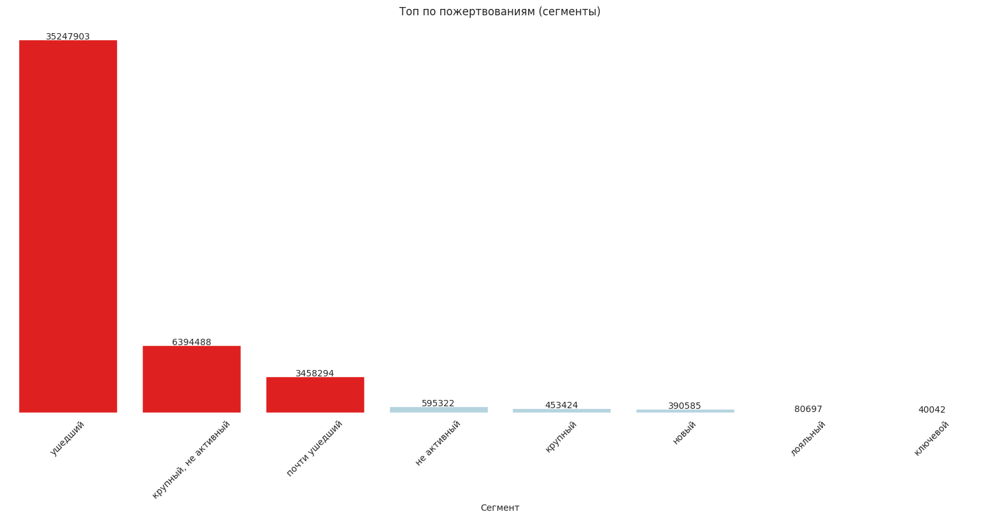

In [ ]:
# для удобства восприятия дополнительно визуализирем полученные выше выводы
plt.figure(figsize=(20, 8))

colors=['lightblue'] * 8
colors[0], colors[1], colors[2] = 'red', 'red', 'red' # зададим цветовую гамму графика, выделим топ-3

ord = top_seg.order_price.tolist() # выделим параметры графика

sns.barplot(x=top_seg.segment, y=top_seg.order_price, palette=colors) # построим саму диаграмму

for i in range(len(ord)):
        plt.text(i,ord[i], int(ord[i]), horizontalalignment='center') # нанесем подписи к столбцам

ax = plt.gca ()
ax.get_yaxis().set_visible(False) # исключим ось y

for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False) # исключим рамки из графика

plt.xticks(rotation=45)
plt.xlabel('Сегмент')
plt.ylabel('Сумма')
plt.title('Топ по пожертвованиям (сегменты)')
plt.show()

##Коммерческие метрики. Выводы

* общий средний чек (на данный момент он равен 937), как мы можем видеть на протяжении периода в диапазоне 3 лет (2021-2024) имеет восходящую тенденцию. Со значений в районе 10.000 идет плавный рост к 60.000 с периодическими всплесками до 100.000 и выше, что выглядит довольно позитивно. Глядя на средний чек по сегментам можно выделить "ушедший", "крупный", "ключевой", так как их средние чеки самые большие - 998, 934 и 800 соответственно. Динамику средних чеков сегментов с наибольшим средним чеком "крупный", "ключевой", "ушедший", а также "новый" (как потенциально преспективный) можно описать следующим образом. Средний чек сегмента "ушедший" не имеет выраженной тенденции и находится в достаточно широком диапазоне 300-5000+. Средний чек сегмента "новый" аналогично не имеет выраженной тенденции, но представляет собой уже менее широкий диапазон 0-500. А вот средний чек сегментов "крупный" и "ключевой" представляют собой нисходящую тенценцию, с отметок 3500 и 1500 до 300
* главный (первый) источник входа. Наиболее распространены каналы входа "email", "сайт", "utm_term Не указан" и "прямой переход" - то же самое что и сайт, соответственно. Всего осуществило первый переход от 2000 до 3000 таких пользователей по каждому из каналов (преимущественно таких сегментов как "почти ушедший", "ушедший", "крупный, не активный")
* активность пользователей по дням недели/часам имеет следующую картину. Наиболее активны пользователи во вторник, в последующие дни (кроме выходных) активность немного ниже. А вот в выходные дни самая низкая активность пользователей, что вполне логично. Опять же можем выделить сегменты "почти ушедший", "ушедший", "крупный, не активный". Распределение уровня активности пользователя по часам дня немного напоминает по форме нормальное, с плавным подъемом и пиком в середине дня (в районе 15 часов). Так же можно отметить аномально высокие значения, приходяшиеся на полночь и 10 часов. Рост активности в 10 часов можно объяснить вероятным началом рабочего дня у большинства пользователей (налив чашку кофе, проверяют почту и остальные рутинные дела, между делом заглянув на сайт фонда). Относительно активности ночью предположили, что она исходит от пользователей-рекуррентов, за счет одновременного списания средств. Определили долю рекуррентов по отношению к не рекуррентам среди всех и только "ночных" пользователей и выяснили, что среди вторых доля рекуррентов и правда выше, но не столь значимо (всего 3%)
* топы по пожертвованиям. Отметим 3 первых места, по возрастанию.Это пользователи, представляющие следующие сегменты - "почти ушедший" (35.247.903), "крупный, не активный" (6.394.488) и "ушедший" (3.458.294)

##Маркетинговые метрики

###Анализ каналов привлечения

*Определим общую эффективность взаимодействия пользователей с теми или иными каналами и выведем общий рейтинг их популярности*

In [ ]:
# обрисуем общую картину по каналам привлечения
top_all_chan = seg_chan.pivot_table(index=['segment', 'channel_id'], values='user_id', aggfunc='nunique').reset_index()
top_all_chan.columns = ['segment', 'channel_id', 'users_count']
top_all_chan.channel_id = top_all_chan.channel_id.astype('str')
top_all_chan.sample(2)

,segment,channel_id,users_count
103,почти ушедший,yandex.ru,528
72,новый,google.com,9


In [ ]:
# продемострируем выведенные выше данные
plt.figure(figsize=(20, 10))
fig = px.bar(top_all_chan.sort_values('users_count', ascending=False), x='channel_id', y='users_count', color='segment')
fig.update_layout(title = 'Рейтинг каналов привлечения (сегменты)',
                  xaxis_title = 'Каналы привлечения',
                  yaxis_title = 'Количество пользователей')
fig.show()

<Figure size 2000x1000 with 0 Axes>

###Пики платежей по акциям

*Определим перечень акций, которые стали пиковыми по активности со стороны пользователей*

In [ ]:
# группируем данные по акциям и посмотрим на общую активность в этот день
camp_act = channels.groupby('utm_campaign')['action_date']\
.count().reset_index().sort_values('action_date',ascending=False)\
.head(10) # сортируем для удобства и оставим только 10 акций с наибольшей активностью

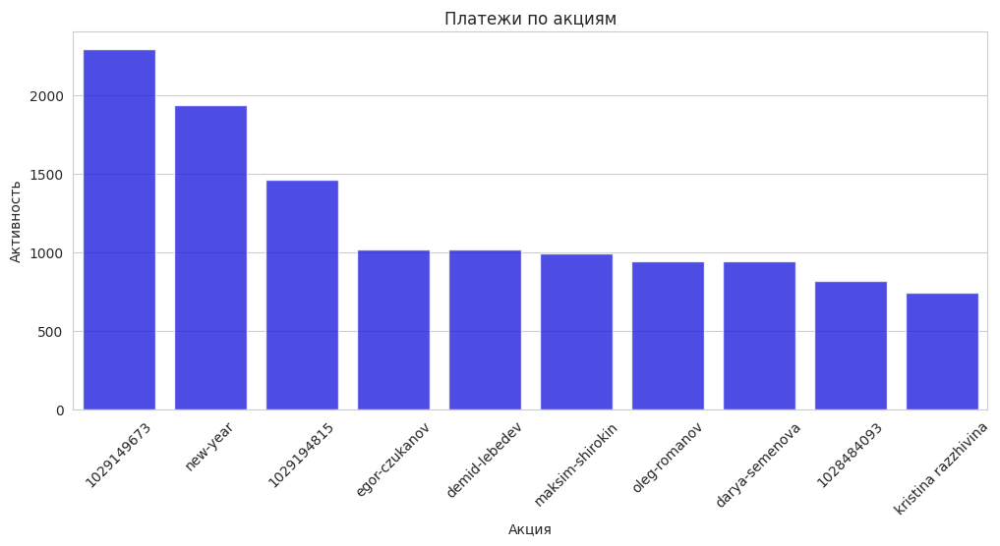

In [ ]:
# визуализируем полученные выше данные посредством столбчатой диаграммы
f, ax = plt.subplots(figsize=(12, 5))

ax = sns.barplot(data = camp_act, x = 'utm_campaign', y = 'action_date', alpha=0.8, color='blue')
ax.set_xlabel('Акция')
ax.set_ylabel('Активность')
ax.set_title('Платежи по акциям')
plt.xticks(rotation=45)
plt.show()

##Маркетинговые метрики. Выводы

* из всех каналов взаимодествия пользователей аналогично первому касанию можно отметить каналы с "email", "сайт" (наибольшая активность, около 18К действий) и "utm_campaign", "прямой переход", то же самое что "сайт" (в диапазоне 6-7К действий)
* самыми пиковыми акциями можно считать акции "1029149673", "new-year", "1029194815", активность по этим акциям наибольшая (от 1500 до 2500 платежей). Затем следуют "egor-czukanov", "demid-lebedev", "maksim-shirokin", "oleg-romanov", "darya-semenova", "1028484093" и "kristina razzhivina" (около 1000 платежей)

#Основные выводы и рекомендации

**Общий анализ**

Говоря в общем большинство доноров не являются рекуррентами (отправляют пожертвования не регулярно), преимущественно женщины (14410), мужчин (4305), в основном из таких городов как Вена, Москва и Санкт-Петербург. Динамика регистраций/редактирования донорских профилей подвержена планомерному росту на протяжении периода 2021-01-01 - 2024-03-18. Большинство пользователей оформивших подписку, сделали это посредством электронной почты и как следствие мы наблюдаем взаимосвязь/корреляцию между параметрами email_invalid (валидна ли почта) и sub_email (подписка в точке контакта email). Динамика активности по самим пожертвованиям тоже подвержена планомерному росту на протяжении аналогичного периода 2021-01-01 - 2024-03-18, в медианный и средний размеры которых 300 и 937 соответственно, а 95% платежей не превышают 3000 (на сайте фонда есть несколько кнопок с фиксированной суммой пожертвования - 300, 500, 1500 и 3000, логично что основная масса доноров делает пожертвования в рамках этих сумм). Но так же есть некоторые аномально высокие платежи, а именно в диапазоне 400-800К всего 7 пожертвований и 1 пожертвование свыше 1млн. Сами же платежи производились непосредственно посредством точки контакта "сайт". Если говорить о статусе платежа, то 52058 случаях они в статусе "paid", в 14852 - в статусе "notpaid" и 6853 - в статусе "fail". Наиболее популярное действие - "переход на сайт". Из всех идентификаторов каналов привлечения большинство представлено индентификатором 3 ("email") (80%), затем по убыванию - 9 ("сайт") (13%) и 1 ("админитративный сайт Mindbox") (2,7%). Остальных каналов значительно меньше (около или менее 1%)

**Пользовательские метрики**

Всего исторических пользователей 7343, что составляет 31% от всех. Среди исторических больше тех, кто сохранил активность, но не отправляет пожертвования (активные, отправляющие пожертвования в меньшинстве). Канал, через который производилось первое действие историческими пользователями - "email" (id 3). Среди тех, отправлял пожертвования в 2024 большая доля мужчин (40%), рекуррентов (40%) и пользователей из региона "Вена" по отношению в другим историческим пользователям. Новых же пользователей, информацией о которых мы обладаем 16477, что является 69% от общего количества пользователей. Наиболее популярным каналом, через который осуществлялись первые действия - в подавляющем большинстве "email" (id 3), но так же мы наблюдаем наличие таких каналов как "прямой переход" (id 5), "Web Push" (id 8) и "Сайт" (id 9). Среди новых пользователей всего женщин 78%, мужчин соответственно 22%. Подавляющее большинство новых пользователей (93%) рекуррентами не являются

**RFM-анализ**

В рамках rfm-анализа было получено 8 сегментов, а именно следующие: ключевой, лояльный, крупный, неактивный, крупный неактивный, новый, почти ушедший, ушедший. Сегменты "ушедший" и "почти ушедший" представлены 3542 и 8796 пользователями, общая сумма пожертвований от которых 30112872 и 2596064, со средней продолжительностью "жизни" 328 и 1 день соответственно. На данный момент на этот сегмент не стоит тратить много усилий и внимания, либо сделать это в последнюю очередь. Например предложить какие-либо акции или оценить некоторые нововведения, которые этот сегмент мог упустить. Сегменты "не активный" и "крупный, не активный" представлены 1291 и 4258 пользователями, общая сумма пожертвований от которых 401169 и 4882987, со средней продолжительностью "жизни" 28 и 132 соответственно. Эти пользователи уже более перспективны к "оживлению". В качестве мер по "оживлению" можно предложить скидку и обязательно собрать обратную связь, чтобы в дальнейшем снизить вероятность пополнения этого сегмента новыми пользователями. Сегменты "крупный" и "лояльный" представлены 304 и 209 пользователями, общая сумма пожертвований от которых 360944 и 60220, со средней продолжительностью "жизни" 1.3 и 1.2 дней соответственно. Очень ценные сегменты пользователей. Вместо скидок и каких-либо акций предложить какой-нибудь подарок или персонализированные услуги. Сегмент "новый" представлен 289 пользователями, общая сумма пожертвований от которого 257270, со средней продолжительностью "жизни" 253 дня. Это совсем недавние пользователи, поэтому важно будет замотивировать их продолжить сотрудничество. Например можно дополнительно поблагодарить их за выбор, а так же предложить подписаться на социальные сети. И наконец сегмент "ключевой" представлен 32 пользователями, общая сумма пожертвований от которого 35142, со средней продолжительностью "жизни" 1.4 дня. Это самые идеальные доноры, так что важно показать им их ценность. Например можно попросить оставить отзыв и предложить персонализированные услуги

**Коммерческие метрики**

Общий средний чек (на данный момент за весь период составляет 937), как мы можем видеть на протяжении периода в диапазоне 3 лет (2021-2024) имеет восходящую тенденцию. Со значений в районе 10.000 идет плавный рост к 60.000 с периодическими всплесками до 100.000 и выше, что выглядит довольно позитивно. Глядя на средний чек по сегментам можно выделить "ушедший", "крупный", "ключевой", так как их средние чеки самые большие - 998, 934 и 800 соответственно. Динамику средних чеков сегментов с наибольшим средним чеком "крупный", "ключевой", "ушедший", а также "новый" (как потенциально преспективный) можно описать следующим образом. Средний чек сегмента "ушедший" не имеет выраженной тенденции и находится в достаточно широком диапазоне 300-5000+. Средний чек сегмента "новый" аналогично не имеет выраженной тенденции, но представляет собой уже менее широкий диапазон 0-500. А вот средний чек сегментов "крупный" и "ключевой" представляют собой нисходящую тенценцию, с отметок 3500 и 1500 до 300. Наиболее частые главные (первые) источники входа имеют идентификаторы 3, 9, 99, 5 (а именно "email", "сайт", "utm_term Не указан" и "прямой переход" соответственно). Всего осуществило первый переход от 2000 до 3000 таких пользователей по каждому из каналов (преимущественно таких сегментов как "почти ушедший", "ушедший", "крупный, не активный"). Наиболее активны пользователи во вторник, в последующие дни (кроме выходных) активность немного ниже. А вот в выходные дни самая низкая активность пользователей, что вполне логично. Распределение уровня активности пользователя по часам дня немного напоминает по форме нормальное, с плавным подъемом и пиком в середине дня (в районе 15 часов). Так же можно отметить аномально высокие значения, приходящиеся на полночь и 10 часов. Рост активности в 10 часов, можно объяснить вероятным началом рабочего дня у большинства пользователей и посещением сайта между делом, сев за рабочий компьютер. Относительно активности ночью предположим, что она исходит от пользователей-рекуррентов, за счет одновременного списания средств. Определив долю рекуррентов по отношению к не рекуррентам среди всех и только "ночных" пользователей было установлено, что среди вторых доля рекуррентов и правда выше, но не столь значимо (всего 3%). Топы по пожертвованиям. Отметим 3 первых места, по возрастанию.Это пользователи, представляющие следующие сегменты - "почти ушедший" (35.247.903), "крупный, не активный" (6.394.488) и "ушедший" (3.458.294)

**Маркетинговые метрики**

Из всех каналов взаимодествия пользователей аналогично первому касанию можно отметить каналы с id 3 (email), 9 (сайт) (наибольшая активность, около 18К действий) и id 99 (utm_campaign), 5 (прямой переход), то же самое что "сайт" (в диапазоне 6-7К действий). Самыми пиковыми акциями можно считать акции "1029149673", "new-year", "1029194815", активность по этим акциям наибольшая (от 1500 до 2500 платежей). Затем следуют "egor-czukanov", "demid-lebedev", "maksim-shirokin", "oleg-romanov", "darya-semenova", "1028484093" и "kristina razzhivina" (около 1000 платежей)

**Общие рекомендации**

Вообщем оценивая картину по платежам можно отметить, что желательно установить в чем может быть причина наличия некорректных статусов платежей. А именно платежей со статусом "paid" всего 70%, "not_paid" - 20% и "fail" - 10%. Глядя на исторических пользователей, можно отметить что среди исторических, активных в 2024 и платящих наибольший процент мужчин и рекуррентов, чем среди не активных и активных, но не платящих. Рекомендуется принять меры по привлечению к возобновлению, а лучше регулярным платежам женской половины исторических и активных пользователей (поздравления с праздниками, подарки, вообщем работа на лояльность). Пользователям из RFM-сегментов "крупный", "лояльный" предложить подарок, либо персонализированную услугу. "Новым" предложить подписаться на соц. сети, постоянно держать в курсе обновлений и мотивировать на активность. "Ключевым" предложить оставить отзыв и постоянно напоминать о их ценности. Наиболее активное пользовательское время это диапазон 14-16, будние дни (вторник в приоритете). В таком случае именно в эти дни/часы будет наиболее продуктивно напомнить лишний раз о фонде (отправить уведомление об акциях, обновлениях)

*Ссылка на презентацию: https://disk.yandex.ru/i/QI4AKMGT9MP9oQ*